# VarClump2D: Concept test

## _Without optimizations..._

In [2]:
%matplotlib inline

import sys
import numba
#import matlab.engine
import numpy as np
import scipy as sp
import sympy as sym
import numexpr as ne
from math import sqrt, log, floor, ceil
import matplotlib.pyplot as plt
from scipy import interpolate, optimize
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable

from sklearn.cluster import KMeans

#import of acalib helper functions
sys.path.append('../../ACALIB/')
from acalib import acontainer as ac

#matlab engine
import matlab.engine
eng = matlab.engine.start_matlab()

## Helpers computing functions

In [3]:
"""
Computes RMS value of N-dimensional numpy array
"""
def estimate_rms(data):
    ret = np.sum(data*data) / np.size(data)
    return np.sqrt(ret)

def estimate_entropy(data):
    ml_data = matlab.double(data.tolist())
    return eng.entropy(ml_data, nargout=1)

def estimate_variance(data):
    return np.std(data)**2

## Helpers visualization functions

In [85]:
"""
Helper function to visualize the quality of the solution
"""
def plotter(c, sig, xc, resolution=10, title=None):
    _xe = np.linspace(0., 1., 10*N, endpoint=True)
    _Dx = np.empty((10*N,N))
    for k in range(10*N):
        _Dx[k,:] = (_xe[k] - xc)

    phi_m = phi(_Dx, sig)
    u = np.dot(phi_m, c)
    plt.figure(figsize=(10,6))
    plt.plot(_xe, u, 'r-', label='Solution')
    plt.plot(x_, f(x_), 'b--', label='Data')
    plt.plot(xe, f(xe), 'go', label='Evaluation points')
    plt.title(title)
    plt.legend(bbox_to_anchor=(1.3, 1.0))
    plt.show()

def plot_sol(c, sig, xc, yc, base_level=0., square_c=True, resolution=5, title=None):
    _xe = np.linspace(0., 1., 41*resolution)[1:-1]
    _ye = np.linspace(0., 1., 41*resolution)[1:-1]
    len_xe = len(_xe); len_ye = len(_ye)
    Xe,Ye = np.meshgrid(_xe, _ye, sparse=False)
    xe = Xe.ravel(); ye = Ye.ravel()
    Nc = len(xc)
    Ne = len(xe)
    
    """ 
    Computing distance matrices
    """
    #distance matrices
    Dx = np.empty((Ne,Nc))
    Dy = np.empty((Ne,Nc))
    for k in range(Ne):
        Dx[k,:] = xe[k]-xc
        Dy[k,:] = ye[k]-yc
    """
    Computing the Phi matrix
    """
    if square_c: c = c**2
    phi_m = phi(Dx, Dy, sig.reshape(1,-1))
    u = np.dot(phi_m, c) + base_level
    u = u.reshape(len_xe, len_ye)

    """
    2D plot
    """
    plt.figure(figsize=(18,12))
    plt.subplot(1,3,1)
    ax = plt.gca()
    im = ax.imshow(f(_xe, _ye))
    #plt.imshow(np.log10(np.abs(u)+1e-10))
    plt.title('Original')
    plt.axis('off')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)
    
    """
    2D plot
    """
    plt.subplot(1,3,2)
    ax = plt.gca()
    im = ax.imshow(u)
    #plt.imshow(np.log10(np.abs(u)+1e-10))
    plt.title('Solution')
    plt.axis('off')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)
    
    """
    2D plot
    """
    plt.subplot(1,3,3)
    ax = plt.gca()
    im = ax.imshow(f(_xe, _ye)-u)
    #plt.imshow(np.log10(np.abs(u)+1e-10))
    plt.title('Residual')
    plt.axis('off')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)
    plt.show()
    
    #X,Y = np.meshgrid(_xe, _ye,sparse=True)
    #fig = plt.figure(figsize=(15,8))
    #ax = fig.add_subplot(111, projection='3d')
    #ax.plot_surface(X, Y, u, linewidth=0.1, cmap='jet')
    #ax.set_xlabel('x')
    #ax.set_ylabel('y')
    #ax.set_zlabel('I')
    #plt.title('Solution')
    #plt.show()
    return (estimate_variance(f(_xe, _ye)-u), estimate_entropy(f(_xe, _ye)-u))

def params_plot(c, sig, xc, yc, square_c=True):
    if square_c: c = c**2
    plt.figure(figsize=(17,7))
    plt.subplot(1,2,1)
    plt.title('Plot of c parameters')
    plt.xlim(-0.01,1.01)
    plt.ylim(-0.01,1.01)
    plt.scatter(xc, yc, c=c)
    plt.colorbar()
    plt.subplot(1,2,2)
    plt.title('Plot of sig^2 parameters')
    plt.xlim(-0.01,1.01)
    plt.ylim(-0.01,1.01)
    plt.scatter(xc, yc, c=sig**2)
    plt.colorbar()
    plt.show()
    
def params_distribution_plot(c, sig, square_c=True):
    if square_c: c = c**2
    plt.figure(figsize=(14,7))
    plt.subplot(1,2,1)
    plt.title('C distribution')
    plt.hist(c, color='grey', bins=10)
    plt.subplot(1,2,2)
    plt.title('Sig^2 distribution')
    plt.hist(sig**2, color='grey', bins=10)
    plt.show()

## Loading data 2D: Stacking on frequency

In [5]:
"""
Loading data
"""
cont = ac.AContainer()
#cont.load('../../bindata/fits/cubes/Antennae_North.CO3_2Line.Clean.pcal1.image.fits')
#cont.load('../../bindata/fits/cubes/Antennae_South.CO3_2Line.Clean.pcal1.image.fits')
#cont.load('../../bindata/fits/cubes/CenA.CO2_1Line.Clean.image.fits')
#cont.load('../../bindata/fits/cubes/M100line.image.fits')
cont.load('../../ACALIB/bindata/fits/cubes/Orion.methanol.cbc.contsub.image.fits')
#cont.load('../../bindata/fits/cubes/ALMA01000740.fits')

cube = cont.primary
spar = cube.standarize()
data = cube.stack(axis=(0))
data /= data.max()

INFO: Processing HDU 0 (Image) [acalib.io.formats]
INFO: 4D data detected: assuming RA-DEC-FREQ-STOKES (like CASA-generated ones), and dropping STOKES [acalib.io.formats]


In [6]:
"""
Generating the data function
"""
x = np.linspace(0., 1., len(data[0]), endpoint=True)
y = np.linspace(0., 1., len(data[1]), endpoint=True)
f = sp.interpolate.interp2d(x, y, data, kind='linear')

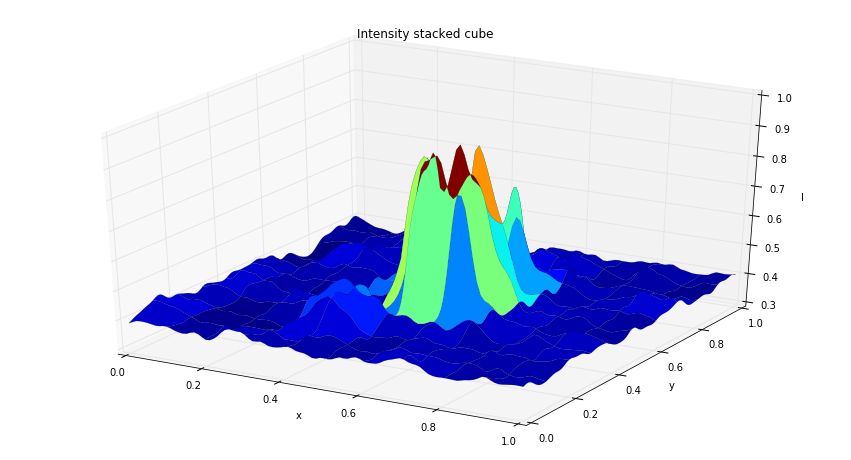

In [7]:
X,Y = np.meshgrid(x,y,sparse=True)
#3d plot
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, data, linewidth=0.1, cmap='jet')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('I')
plt.title('Intensity stacked cube')
plt.show()

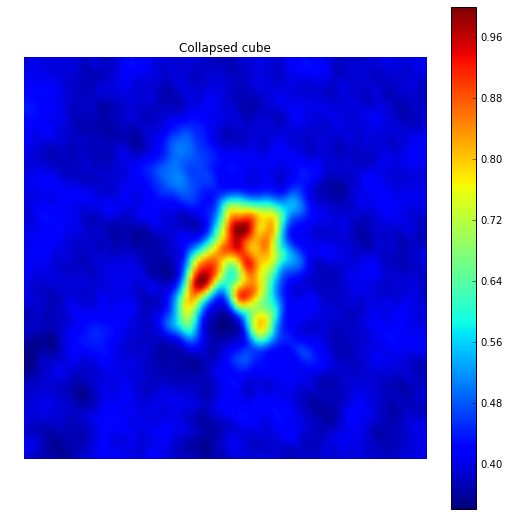

In [8]:
plt.figure(figsize=(9,9))
plt.imshow(data)
plt.title('Collapsed cube')
plt.axis('off')
plt.colorbar()
plt.show()

## Euler-Lagrange Derivation

Given the following functional: 

$$J(u) = \int_{\Omega \subset \mathbb{R}} L(x, y, u, u_x, u_y) \ d\Omega  = \int_{\Omega \subset \mathbb{R}}(u(x,y)-f_0(x,y))^2 + \alpha \ \Psi_1(u(x,y)-f_0(x,y)) + \beta \ \Psi_2(\left|\nabla u(x,y)\right|^2) \ d\Omega $$

then when we try to minimize it, the corresponding Euler-Lagrange equation becomes:

$$
\frac{\partial L}{\partial u}-\frac{d}{dx}\frac{\partial L}{\partial u_x} - \frac{d}{dy}\frac{\partial L}{\partial u_y}= 0$$

$$
2(u-f) + \alpha \Psi_1'(u-f) -2\beta \Big( 2\Psi_2''(u_x^2+u_y^2) \left[(u_x u_{xx} + u_y u_{yx})u_x + (u_x u_{xy} + u_y u_{yy})u_y \right] + \Psi_2'(u_x^2 + u_y^2) \left[u_{xx}+u_{yy} \right] \Big) = 0
$$

whit boundary condition $u(\partial \Omega) = f(\partial \Omega)$. The proposed solution has the form of a linear combination of Gaussian functions:

$$u(x,y) = \sum_{i=1}^N c_i \ \phi(x, y;\ x_i, \sigma_i) = \sum_{i=1}^N c_i \ e^{-\frac{(x-x_i)^2 + (y-y_i)^2}{2 \sigma_i^2}}$$

## Defining and computing the penalizing functions $\Psi_1$ and $\Psi_2$ (will be the same)

In [9]:
"""
General Psi penalizing function (applicable in both cases)
"""
def psi(x, lamb=1.):
    x = lamb*x
    ret = np.empty(x.shape)
    mask0 = x<=0.
    mask1 = x>=1.
    mask01 = np.logical_and(np.logical_not(mask0),np.logical_not(mask1))
    ret[mask0] = 0.
    ret[mask1] = 1.
    #evaluation on 0-1
    x = x[mask01]
    ret[mask01] = ne.evaluate('10*x**3 - 15*x**4 + 6*x**5')
    return ret

def d1psi(x, lamb=1.):
    x = lamb*x
    ret = np.empty(x.shape)
    mask0 = x<=0.
    mask1 = x>=1.
    mask01 = np.logical_and(np.logical_not(mask0),np.logical_not(mask1))
    ret[mask0] = 0.
    ret[mask1] = 0.
    #evaluation on 0-1
    x = x[mask01]
    ret[mask01] = ne.evaluate('30*x**2 - 60*x**3 + 30*x**4')
    return lamb*ret

def d2psi(x, lamb=1.):
    x = lamb*x
    ret = np.empty(x.shape)
    mask0 = x<=0.
    mask1 = x>=1.
    mask01 = np.logical_and(np.logical_not(mask0),np.logical_not(mask1))
    ret[mask0] = 0.
    ret[mask1] = 0.
    #evaluation on 0-1
    x = x[mask01]
    ret[mask01] = ne.evaluate('60*x - 180*x**2 + 120*x**3')
    return (lamb**2)*ret

## $\phi$-RBF function to use and its derivatives

In [10]:
#minimal broadening of gaussians
minsig = 0.001

"""
RBF (Gaussian) functions and its derivatives
"""
def phi(x, y, sig, sig0=minsig, supp=5.):
    retval = ne.evaluate('exp(-(x**2+y**2)/(2*(sig0**2+sig**2)))')
    if supp>0.: retval[retval<np.exp(-supp**2)] = 0.
    return retval

def phix(x, y, sig, sig0=minsig, supp=5.):
    retval = ne.evaluate('(-1./(sig0**2+sig**2)) * exp(-(x**2+y**2)/(2*(sig0**2+sig**2))) * x')
    if supp>0.: retval[retval<np.exp(-supp**2)] = 0.
    return retval

def phiy(x, y, sig, sig0=minsig, supp=5.):
    retval = ne.evaluate('(-1./(sig0**2+sig**2)) * exp(-(x**2+y**2)/(2*(sig0**2+sig**2))) * y')
    if supp>0.: retval[retval<np.exp(-supp**2)] = 0.
    return retval

#same as phiyx
def phixy(x, y, sig, sig0=minsig, supp=5.):
    retval = ne.evaluate('(1./(sig0**2+sig**2)**2) * exp(-(x**2+y**2)/(2*(sig0**2+sig**2))) * (x*y)')
    if supp>0.: retval[retval<np.exp(-supp**2)] = 0.
    return retval

def phixx(x, y, sig, sig0=minsig, supp=5.):
    retval = ne.evaluate('(1./(sig0**2+sig**2)**2) * exp(-(x**2+y**2)/(2*(sig0**2+sig**2))) * (x**2 - sig0**2 - sig**2)')
    if supp>0.: retval[retval<np.exp(-supp**2)] = 0.
    return retval

def phiyy(x, y, sig, sig0=minsig, supp=5.):
    retval = ne.evaluate('(1./(sig0**2+sig**2)**2) * exp(-(x**2+y**2)/(2*(sig0**2+sig**2))) * (y**2 - sig0**2 - sig**2)')
    if supp>0.: retval[retval<np.exp(-supp**2)] = 0.
    return retval

## Euler-Lagrange function class definition

In [11]:
class ELFunc():
    def __init__(self, f, xe, ye, xc, yc, xb, yb, c0, sig0, d1psi1=None, d1psi2=None, d2psi2=None,
                 a=0., b=0., lamb1=1., lamb2=1., base_level=0, square_c=True, compact_supp=True):
        f0 = np.array([f(xe[i],ye[i]) for i in range(len(xe))]).ravel()
        fb = np.array([f(xb[i],yb[i]) for i in range(len(xb))]).ravel()
        len_f0 = len(f0)
        len_c0 = len(c0)
        len_sig0 = len(sig0)
        Ne = len(xe)
        Nc = len(xc)
        Nb = len(xb)

        """ 
        Computing distance matrices
        """
        #distance matrices
        Dx = np.empty((Ne,Nc))
        Dy = np.empty((Ne,Nc))
        for k in range(Ne):
            Dx[k,:] = xe[k]-xc
            Dy[k,:] = ye[k]-yc
        #distance matrices for boundary points
        Dxb = np.empty((Nb,Nc))
        Dyb = np.empty((Nb,Nc))
        for k in range(Nb):
            Dxb[k,:] = xb[k]-xc
            Dyb[k,:] = yb[k]-yc
            
        """
        Computing Phi matrices
        """
        if not compact_supp:
            phi_m = phi(Dx, Dy, sig0.reshape(1,-1), supp=0.)
            phix_m = phix(Dx, Dy, sig0.reshape(1,-1), supp=0.)
            phiy_m = phiy(Dx, Dy, sig0.reshape(1,-1), supp=0.)
            phixx_m = phixx(Dx, Dy, sig0.reshape(1,-1), supp=0.)
            phixy_m = phixy(Dx, Dy, sig0.reshape(1,-1), supp=0.)
            phiyy_m = phiyy(Dx, Dy, sig0.reshape(1,-1), supp=0.)
        else:
            phi_m = phi(Dx, Dy, sig0.reshape(1,-1))
            phix_m = phix(Dx, Dy, sig0.reshape(1,-1))
            phiy_m = phiy(Dx, Dy, sig0.reshape(1,-1))
            phixx_m = phixx(Dx, Dy, sig0.reshape(1,-1))
            phixy_m = phixy(Dx, Dy, sig0.reshape(1,-1))
            phiyy_m = phiyy(Dx, Dy, sig0.reshape(1,-1))
        
        """
        Storing important atributes
        """
        self.f0 = f0
        self.fb = fb
        self.xe = xe; self.ye = ye
        self.xc = xc; self.yc = yc
        self.xb = xb; self.yb = yb
        self.Dx = Dx; self.Dxb = Dxb
        self.Dy = Dy; self.Dyb = Dyb
        self.phi_m = phi_m
        self.phix_m = phix_m
        self.phiy_m = phiy_m
        self.phixx_m = phixx_m
        self.phiyy_m = phiyy_m
        self.phixy_m = phixy_m
        self.c = c0
        self.sig = sig0
        self.d1psi1 = d1psi1
        self.d1psi2 = d1psi2
        self.d2psi2 = d2psi2
        self.a = a
        self.b = b
        self.lamb1 = lamb1
        self.lamb2 = lamb2
        self.base_level = base_level
        self.square_c = square_c
        self.compact_supp = compact_supp
        
    def set_c(self, c):
        self.c = c

    def set_sig(self, sig):
        self.sig = sig
        """
        Re-computing Phi matrices
        """
        if not self.compact_supp:
            self.phi_m = phi(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #self.phix_m = phix(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #self.phiy_m = phiy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #self.phixx_m = phixx(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #self.phixy_m = phixy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #self.phiyy_m = phiyy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
        else:
            self.phi_m = phi(self.Dx, self.Dy, sig.reshape(1,-1))
            #self.phix_m = phix(self.Dx, self.Dy, sig.reshape(1,-1))
            #self.phiy_m = phiy(self.Dx, self.Dy, sig.reshape(1,-1))
            #self.phixx_m = phixx(self.Dx, self.Dy, sig.reshape(1,-1))
            #self.phixy_m = phixy(self.Dx, self.Dy, sig.reshape(1,-1))
            #self.phiyy_m = phiyy(self.Dx, self.Dy, sig.reshape(1,-1))
    
    def F(self, X):
        N = len(X)/2
        if self.square_c: c = X[0:N]**2
        else: c = X[0:N]
        sig = X[N:]
        
        """
        Computing the Phi-matrices
        """
        if not self.compact_supp:
            phi_m = phi(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phix_m = phix(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phiy_m = phiy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phixx_m = phixx(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phixy_m = phixy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phiyy_m = phiyy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
        else:
            phi_m = phi(self.Dx, self.Dy, sig.reshape(1,-1))
            #phix_m = phix(self.Dx, self.Dy, sig.reshape(1,-1))
            #phiy_m = phiy(self.Dx, self.Dy, sig.reshape(1,-1))
            #phixx_m = phixx(self.Dx, self.Dy, sig.reshape(1,-1))
            #phixy_m = phixy(self.Dx, self.Dy, sig.reshape(1,-1))
            #phiyy_m = phiyy(self.Dx, self.Dy, sig.reshape(1,-1))
        
        """
        Computing u, ux, uy, ...
        """
        u = np.dot(phi_m, c) + self.base_level
        #ux = np.dot(phix_m, c)
        #uy = np.dot(phiy_m, c)
        #uxx = np.dot(phixx_m, c)
        #uyy = np.dot(phiyy_m, c)
        #uxy = np.dot(phixy_m, c)
        
        """
        Computing the EL equation
        """
        """el = 2.*(u-self.f0) + \
            self.a*self.d1psi1(u-self.f0, self.lamb1) - \
            2*self.b*(2*self.d2psi2(ux**2 + uy**2, self.lamb2) * ((ux*uxx + uy*uxy)*ux + (ux*uxy + uy+uyy)*uy) + \
                      self.d1psi2(ux**2 + uy**2, self.lamb2)*(uxx + uyy))"""
        el = 2.*(u-self.f0) + self.a*self.d1psi1(u-self.f0, self.lamb1)
        #el = 2.*(u-self.f0)
        
        """
        Boundary conditions (need to add thresh)
        """
        bc = np.dot(phi(self.Dxb, self.Dyb, sig.reshape(1,-1)), c) + self.base_level - self.fb
        return np.concatenate([el,bc])
    
    def F1(self, c):
        if self.square_c: c = c**2
        
        """
        Computing u, ux, uy, ...
        """
        u = np.dot(self.phi_m, c) + self.base_level
        #ux = np.dot(phix_m, c)
        #uy = np.dot(phiy_m, c)
        #uxx = np.dot(phixx_m, c)
        #uyy = np.dot(phiyy_m, c)
        #uxy = np.dot(phixy_m, c)
        
        """
        Computing the EL equation
        """
        """el = 2.*(u-self.f0) + \
            self.a*self.d1psi1(u-self.f0, self.lamb1) - \
            2*self.b*(2*self.d2psi2(ux**2 + uy**2, self.lamb2) * ((ux*uxx + uy*uxy)*ux + (ux*uxy + uy+uyy)*uy) + \
                      self.d1psi2(ux**2 + uy**2, self.lamb2)*(uxx + uyy))"""
        el = 2.*(u-self.f0) + self.a*self.d1psi1(u-self.f0, self.lamb1)
        #el = 2.*(u-self.f0)
        
        """
        Boundary conditions
        """
        bc = np.dot(phi(self.Dxb, self.Dyb, self.sig.reshape(1,-1)), c) + self.base_level - self.fb
        return np.concatenate([el,bc])
        
    def F2(self, sig):
        if self.square_c: c = self.c**2
        else: c = self.c

        """
        Computing the Phi-matrices
        """
        if not self.compact_supp:
            phi_m = phi(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phix_m = phix(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phiy_m = phiy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phixx_m = phixx(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phixy_m = phixy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
            #phiyy_m = phiyy(self.Dx, self.Dy, sig.reshape(1,-1), supp=0.)
        else:
            phi_m = phi(self.Dx, self.Dy, sig.reshape(1,-1))
            #phix_m = phix(self.Dx, self.Dy, sig.reshape(1,-1))
            #phiy_m = phiy(self.Dx, self.Dy, sig.reshape(1,-1))
            #phixx_m = phixx(self.Dx, self.Dy, sig.reshape(1,-1))
            #phixy_m = phixy(self.Dx, self.Dy, sig.reshape(1,-1))
            #phiyy_m = phiyy(self.Dx, self.Dy, sig.reshape(1,-1))
        
        """
        Computing u, ux, uy, ...
        """
        u = np.dot(phi_m, c) + self.base_level
        #ux = np.dot(phix_m, c)
        #uy = np.dot(phiy_m, c)
        #uxx = np.dot(phixx_m, c)
        #uyy = np.dot(phiyy_m, c)
        #uxy = np.dot(phixy_m, c)
        
        """
        Computing the EL equation
        """
        """el = 2.*(u-self.f0) + \
            self.a*self.d1psi1(u-self.f0, self.lamb1) - \
            2*self.b*(2*self.d2psi2(ux**2 + uy**2, self.lamb2) * ((ux*uxx + uy*uxy)*ux + (ux*uxy + uy+uyy)*uy) + \
                      self.d1psi2(ux**2 + uy**2, self.lamb2)*(uxx + uyy))"""
        el = 2.*(u-self.f0) + self.a*self.d1psi1(u-self.f0, self.lamb1)
        #el = 2.*(u-self.f0)
        
        """
        Boundary conditions
        """
        bc = np.dot(phi(self.Dxb, self.Dyb, sig.reshape(1,-1)), c) + self.base_level - self.fb
        return np.concatenate([el,bc])

$$
2(u-f) + \alpha \Psi_1'(u-f) -2\beta \Big( 2\Psi_2''(u_x^2+u_y^2) \left[(u_x u_{xx} + u_y u_{yx})u_x + (u_x u_{xy} + u_y u_{yy})u_y \right] + \Psi_2'(u_x^2 + u_y^2) \left[u_{xx}+u_{yy} \right] \Big) = 0
$$

## Centers and evaluation points

#### Thresholded data: Over the RMS value.

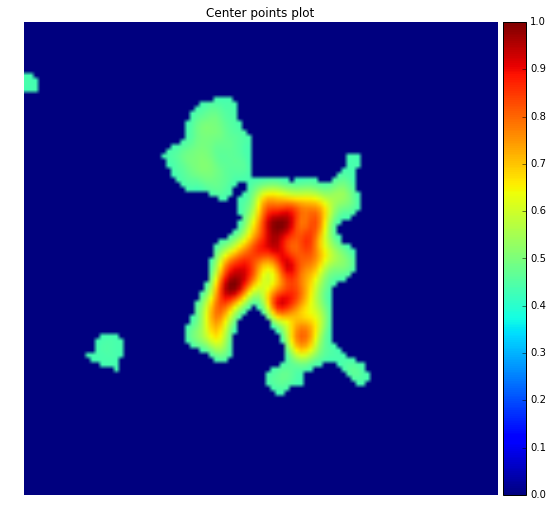

In [12]:
plt.figure(figsize=(9,9))
ax = plt.gca()
_data = np.zeros(data.shape)
mask = data > estimate_rms(data)
_data[mask] = data[mask]
im = ax.imshow(_data)
plt.title('Center points plot')
plt.axis('off')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.08)
plt.colorbar(im, cax=cax)
plt.show()

In [13]:
"""
Boundary points
"""
#number of boundary points by side
Nb = 0
Nc = 500
Ne = 2*Nc-4*Nb

xb = []
yb = []

for val in np.linspace(0., 1., Nb+1)[0:-1]:
    xb.append(val)
    yb.append(0.)
for val in np.linspace(0., 1., Nb+1)[0:-1]:
    xb.append(1.)
    yb.append(val)
for val in np.linspace(0., 1., Nb+1)[::-1][:-1]:
    xb.append(val)
    yb.append(1.)
for val in np.linspace(0., 1., Nb+1)[::-1][:-1]:
    xb.append(0.)
    yb.append(val)
xb = np.asarray(xb)
yb = np.asarray(yb)
boundary_points = np.vstack([xb,yb]).T

In [14]:
def accumulation_points_finder(x, y, data, n_ipoints=100, n_epoints=100, method='weighted_kmeans', factor=1.,):
    #structuring the data
    X,Y = np.meshgrid(x, y, sparse=False)
    rms = estimate_rms(data)
    mask = data > rms
    #extracting positions and values over the rms
    iX = X[mask]; iY = Y[mask]; idata = data[mask]
    _idata = np.array([iX, iY, idata])
    #extracting positions and values above the rms
    eX = X[~mask]; eY = Y[~mask]; edata = data[~mask]
    _edata = np.array([eX, eY, edata])

    if method=='weighted_kmeans':
        """
        Clustering for points over the RMS
        """
        res = []
        for i in range(len(idata)):
            w = int(ceil((idata[i]/rms)**factor))
            res.extend([[iX[i],iY[i]]]*w)
        res = np.asarray(res)
        #kmeans object instantiation
        ikmeans = KMeans(init='k-means++', n_clusters=n_ipoints, n_init=20, n_jobs=2)
        #performing kmeans clustering
        ikmeans.fit(res)
        """
        Clustering for points above the RMS
        """
        res = []
        rms = estimate_rms(edata)
        for i in range(len(edata)):
            w = int(ceil((edata[i]/rms)**factor))
            res.extend([[eX[i],eY[i]]]*w)
        res = np.asarray(res)
        #kmeans object instantiation
        ekmeans = KMeans(init='k-means++', n_clusters=n_epoints, n_init=20, n_jobs=2)
        #performing kmeans clustering
        ekmeans.fit(res)
        """
        Concatenating and returning cetroid positions
        """
        return np.vstack([ikmeans.cluster_centers_[:,:2],ekmeans.cluster_centers_[:,:2]])

def points_plot(data, center_points=None, collocation_points=None, boundary_points=None):
    if (center_points is not None) and (collocation_points is None):
        plt.figure(figsize=(12,12))
        plt.imshow(data)
        plt.scatter(center_points[:,0]*99, center_points[:,1]*99, c='r', s=5, label='center')
        plt.title('Center points')
        plt.axis('off')
    elif (center_points is None) and (collocation_points is not None):
        plt.figure(figsize=(12,12))
        plt.imshow(data)
        plt.scatter(collocation_points[:,0]*99, collocation_points[:,1]*99, c='g', s=5, label='collocation')
        plt.title('Collocation points')
        plt.axis('off')
    elif (center_points is not None) and (collocation_points is not None):
        fig = plt.figure(figsize=(20,15))
        ax1 = fig.add_subplot(121)
        ax1.imshow(data)
        ax1.scatter(center_points[:,0]*99, center_points[:,1]*99, c='r', s=5, label='center')
        ax1.set_title('Center points')
        ax1.axis('off')
        ax2 = fig.add_subplot(122)
        ax2.imshow(data)
        ax2.scatter(collocation_points[:,0]*99, collocation_points[:,1]*99, c='g', s=5, label='collocation')
        ax2.set_title('Collocation points')
        ax2.axis('off')
    if (boundary_points is not None) and len(boundary_points[:,0])!=0:
        plt.figure(figsize=(12,12))
        plt.imshow(data)
        plt.scatter(boundary_points[:,0]*99, boundary_points[:,1]*99, c='y', s=5, label="boundary")
        plt.axis('off')
    #plt.colorbar(im, cax=cax)
    #fig.legend(bbox_to_anchor=(1.2, 1.0))
    plt.show()

### Visualization of points

In [15]:
center_points = accumulation_points_finder(x, y, data, n_ipoints=Nc/2, n_epoints=Nc/2, factor=5.)
collocation_points = accumulation_points_finder(x, y, data, n_ipoints=Ne/2, n_epoints=Ne/2, factor=5.)

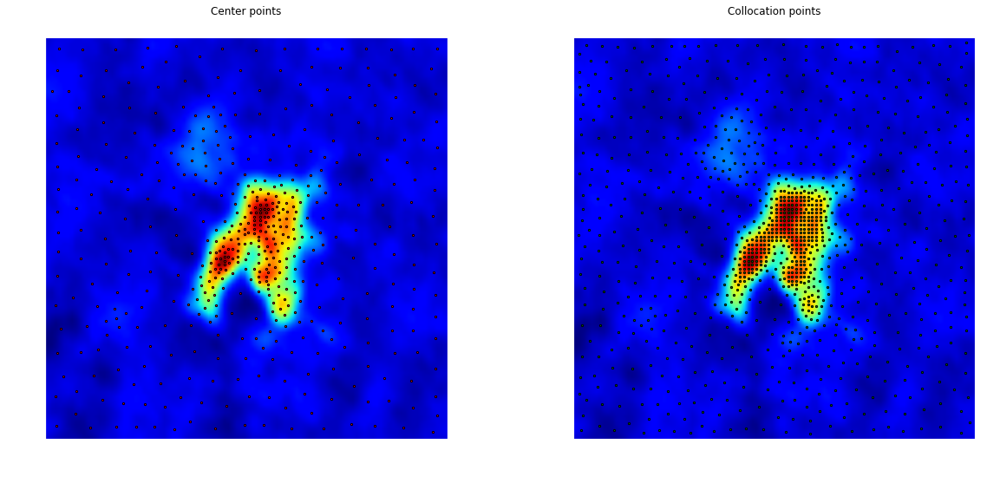

In [16]:
points_plot(data, center_points=center_points, collocation_points=collocation_points)

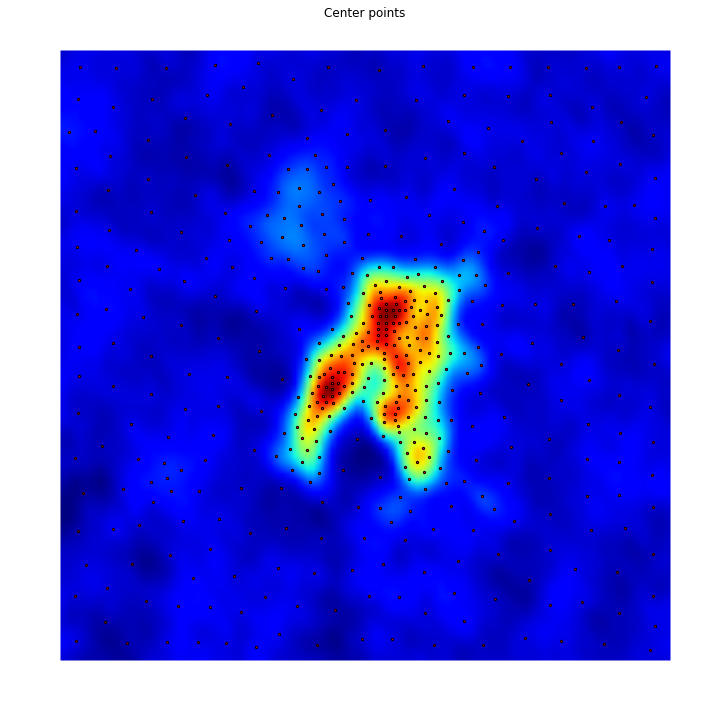

In [17]:
points_plot(data, center_points=center_points)

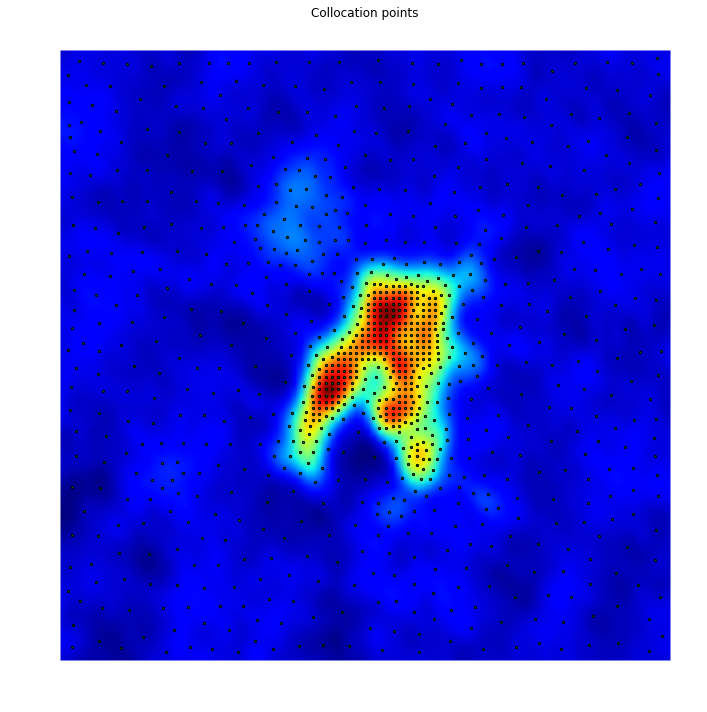

In [18]:
points_plot(data, collocation_points=collocation_points)

In [19]:
points_plot(data, boundary_points=boundary_points)

In [20]:
xc = center_points[:,0]
yc = center_points[:,1]
xe = collocation_points[:,0]
ye = collocation_points[:,1]

## Initial Conditions

In [22]:
"""
Building distances matrix
"""
Nc = center_points.shape[0]
Dx = np.empty((Nc,Nc))
Dy = np.empty((Nc,Nc))
for k in range(Nc):
    Dx[k,:] = xc[k]-xc
    Dy[k,:] = yc[k]-yc
dist_matrix = np.sqrt(Dx**2+Dy**2)

In [23]:
def estimate_initial_guess(center_points, dist_matrix, dfunc, R=0.05, minsig=0.001, method='min_dist'):
    m = center_points.shape[0]
    c_arr = np.empty(m, dtype=float)
    sig_arr = np.empty(m, dtype=float)
    
    if method=='mean_dist':
        f = 1./sqrt(log(2.))
        mean_dist = np.zeros(m, dtype=float)
        num_neigh = np.zeros(m, dtype=float)   
        for i in range(m):
            for j in range(m):
                #dont take into account the same point
                if i==j: continue
                d = dist_matrix[i,j]
                #dont take into account points outside R radius
                if d>R: continue
                num_neigh[i] += 1
                mean_dist[i] += d
            """
            Key Idea: The mean distance to neighbors acurrs when the
            gaussian function has decayed to the half
            """
            if num_neigh[i]==0:
                c_arr[i] = dfunc(*center_points[i])[0]
                sig_arr[i] = minsig
            else:
                mean_dist[i] /= num_neigh[i]
                c_arr[i] = dfunc(*center_points[i])[0]/num_neigh[i]
                #c_arr[i] = dfunc(*center_points[i])[0]*mean_dist[i]**2
                sig_arr[i] = f*mean_dist[i]
                
    elif method=='min_dist':
        min_dist = np.inf*np.ones(m, dtype=float)
        num_neigh = np.zeros(m, dtype=float)
        #first we find the distance to the nearest neighbor
        for i in range(m):
            for j in range(m):
                #dont take into account the same point
                if i==j: continue
                d = dist_matrix[i,j]
                if d<min_dist[i]: min_dist[i] = d
        #second, we find the number of neighbors on the neighborhood
        for i in range(m):
            for j in range(m):
                #dont take into account the same point
                if i==j: continue
                d = dist_matrix[i,j]
                if d > 3*min_dist[i]: continue
                num_neigh[i] += 1
            """
            some explanation here
            """
            if num_neigh[i]==0:
                c_arr[i] = dfunc(*center_points[i])[0]
                sig_arr[i] = minsig
            else:
                c_arr[i] = dfunc(*center_points[i])[0]/(num_neigh[i]+1)
                sig_arr[i] = min_dist[i] 
    return (c_arr,sig_arr)

In [69]:
"""
Initial parameters estimation
"""
#c0, sig0 = estimate_initial_guess(center_points, f, R=0.009, method='mean_dist')
c0, sig0 = estimate_initial_guess(center_points, dist_matrix, f, minsig=minsig, method='min_dist')

## Visualizing the initial solution

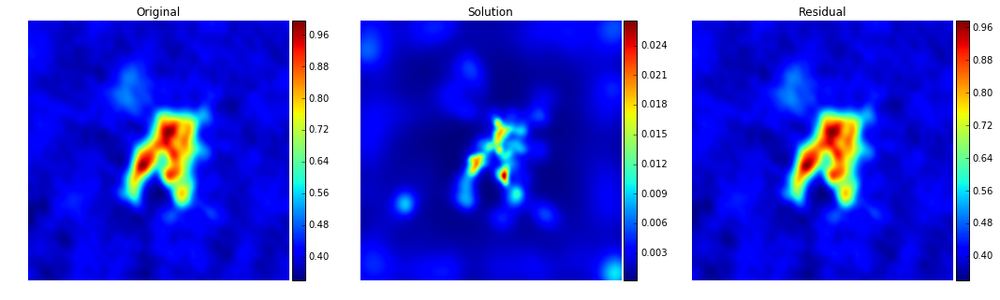

(0.0084779064553090668, 4.937493165365124)

In [70]:
plot_sol(c0, sig0, xc, yc, base_level=0.)
#plot_sol(c0, sig0, xc, yc, base_level=estimate_rms(data))

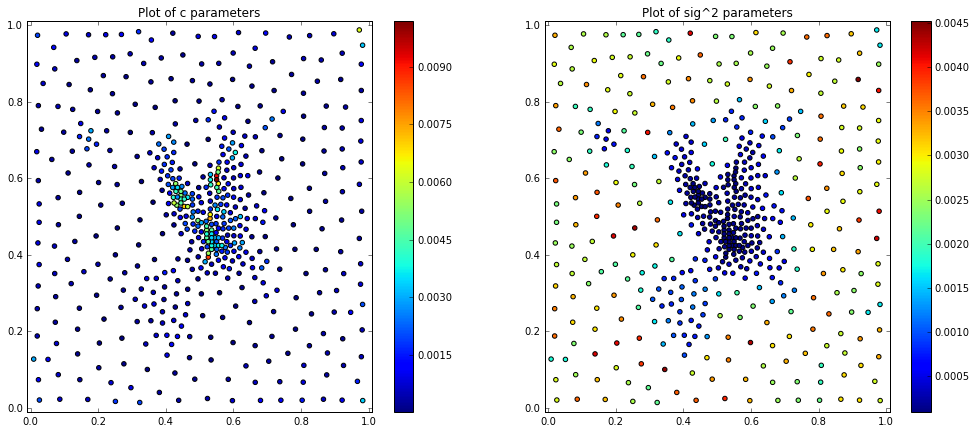

In [71]:
params_plot(c0, sig0, xc, yc, square_c=True)

# Experiments

In [86]:
def el_solver(elf, method='iterative', n_iter=5, verbose=True, base_level=0., square_c=True):
    if method=='exact':
        sol = sp.optimize.root(elf.F, np.concatenate([elf.c, elf.sig]), method='krylov', options={'maxiter':10000})
        opt_c = sol.x[0:Nc]
        opt_sig = sol.x[Nc:]
        plot_sol(opt_c, opt_sig, elf.xc, elf.yc, base_level=base_level, square_c=square_c)
        print('\nmessage: {0}'.format(sol['message']))
        print('\nsuccess: {0}'.format(sol['success']))
        #print('\nopt_c_squared:\n {0}'.format(opt_c**2))
        #print('\nopt_sig:\n {0}'.format(opt_sig))
        print('-------------------------------------------------------------------')
    
    elif method=='iterative':
        residual_variance = []
        residual_entropy = []
        for i in range(n_iter):
            #solve for c
            sol = sp.optimize.root(elf.F1, elf.c, method='lm', options={'maxiter':10000})
            opt_c = sol.x
            delta_c = np.linalg.norm(opt_c-elf.c)
            elf.set_c(opt_c)
            #title = 'Best solution at iter={0} and improved c'.format(i)
            var,entr = plot_sol(elf.c, elf.sig, elf.xc, elf.yc, base_level=base_level, square_c=square_c)
            params_plot(elf.c, elf.sig, elf.xc, elf.yc, square_c=square_c)
            params_distribution_plot(elf.c, elf.sig, square_c=square_c)
            print('Variation on c={0}'.format(delta_c))
            print('\nnfev: {0}'.format(sol['nfev']))
            print('\nmessage: {0}'.format(sol['message']))
            print('\nsuccess: {0}'.format(sol['success']))
            if square_c:
                print('\nmax c and position: {0} and {1}'.format(np.max(opt_c**2), np.argmax(opt_c**2)))
            else:
                print('\nmax c and position: {0} and {1}'.format(np.max(opt_c), np.argmax(opt_c)))  
            
            print('------------------------------------------------------------')
            #appending residual variance and entropy
            residual_variance.append(var)
            residual_entropy.append(entr)

            #solve for sig
            sol = sp.optimize.root(elf.F2, elf.sig, method='lm', options={'maxiter':10000})
            opt_sig = sol.x
            delta_sig = np.linalg.norm(opt_sig-elf.sig)
            elf.set_sig(opt_sig)
            #title = 'Best solution at iter={0} and improved sig'.format(i)
            var,entr = plot_sol(elf.c, elf.sig, elf.xc, elf.yc, base_level=base_level, square_c=square_c)
            params_plot(elf.c, elf.sig, elf.xc, elf.yc, square_c=square_c)
            params_distribution_plot(elf.c, elf.sig, square_c=square_c)
            
            print('Variation on sig={0}'.format(delta_sig))
            print('\nnfev: {0}'.format(sol['nfev']))
            print('\nmessage: {0}'.format(sol['message']))
            print('\nsuccess: {0}'.format(sol['success']))
            print('\nmax sig and position: {0} and {1}'.format(np.max(opt_sig**2), np.argmax(opt_sig**2)))
            print('\nmin sig and position: {0} and {1}'.format(np.min(opt_sig**2), np.argmin(opt_sig**2)))
            print('-------------------------------------------------------------')
            #appending residual variance and entropy
            residual_variance.append(var)
            residual_entropy.append(entr)

            
        print('\n \n SOME FINAL RESULTS:')
        plt.figure(figsize=(12,7))
        plt.subplot(1,2,1)
        plt.plot(range(2*n_iter), residual_variance, 'bo-')
        plt.title('Residual variance')
        plt.subplot(1,2,2)
        plt.plot(range(2*n_iter), residual_entropy, 'ro-')
        plt.title('Residual entropy')
        plt.show()

## Experiments 1: With  `base_level=0`
The following instances test with different settings combinations for: square_c and support

In [87]:
"""
ELFunc instantiations
"""
elf1 = ELFunc(f, xe, ye, xc, yc, xb, yb, np.sqrt(c0), sig0, a=1., lamb1=1., d1psi1=d1psi, d1psi2=d1psi,
              d2psi2=d2psi, base_level=0., square_c=True, compact_supp=True)

elf2 = ELFunc(f, xe, ye, xc, yc, xb, yb, c0, sig0, a=1., lamb1=1., d1psi1=d1psi, d1psi2=d1psi,
              d2psi2=d2psi, base_level=0., square_c=False, compact_supp=True)

elf3 = ELFunc(f, xe, ye, xc, yc, xb, yb, np.sqrt(c0), sig0, a=1., lamb1=1., d1psi1=d1psi, d1psi2=d1psi,
              d2psi2=d2psi, base_level=0., square_c=True, compact_supp=False)

elf4 = ELFunc(f, xe, ye, xc, yc, xb, yb, c0, sig0, a=1., lamb1=1., d1psi1=d1psi, d1psi2=d1psi,
              d2psi2=d2psi, base_level=0., square_c=False, compact_supp=False)

### C-squared and compact support

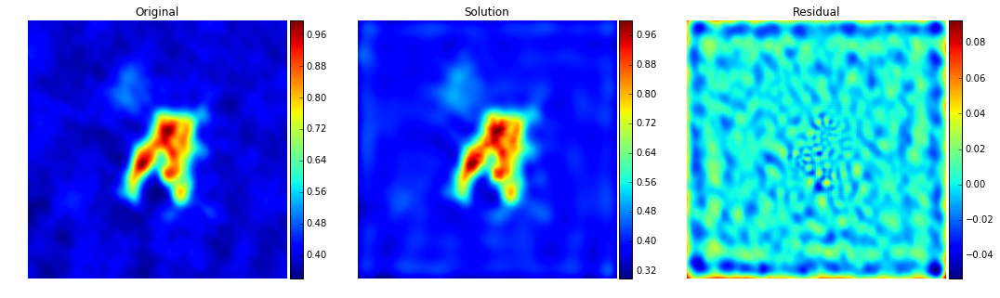

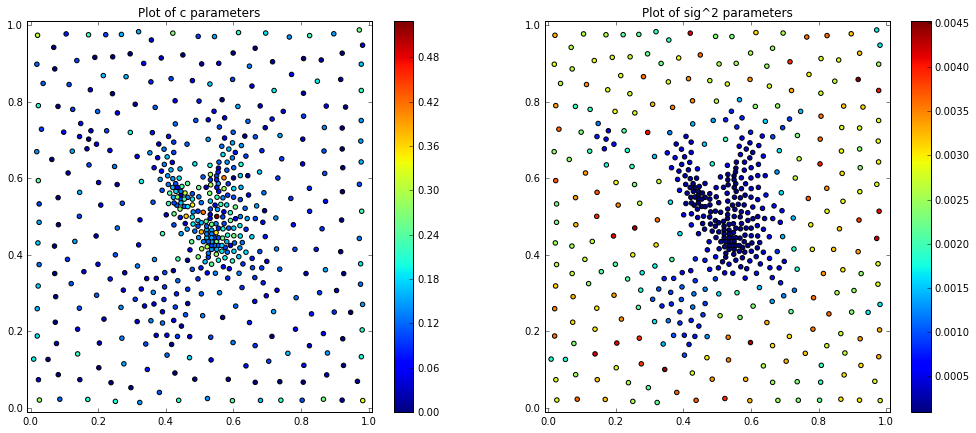

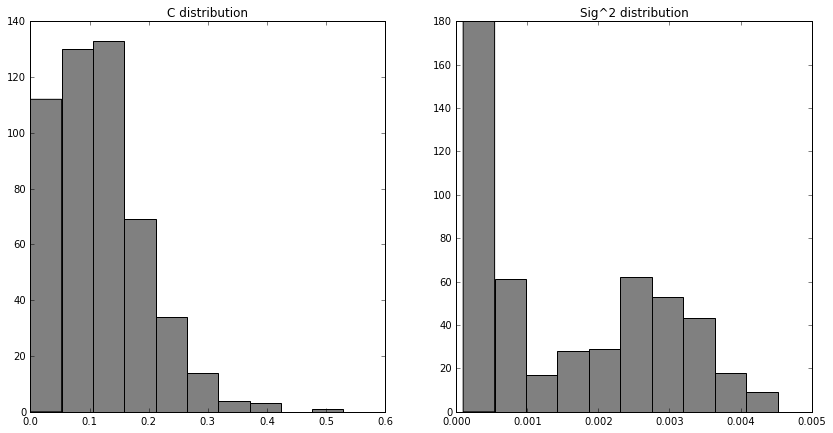

Variation on c=4.3848662508

nfev: 10027

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.529064432611 and 170
------------------------------------------------------------


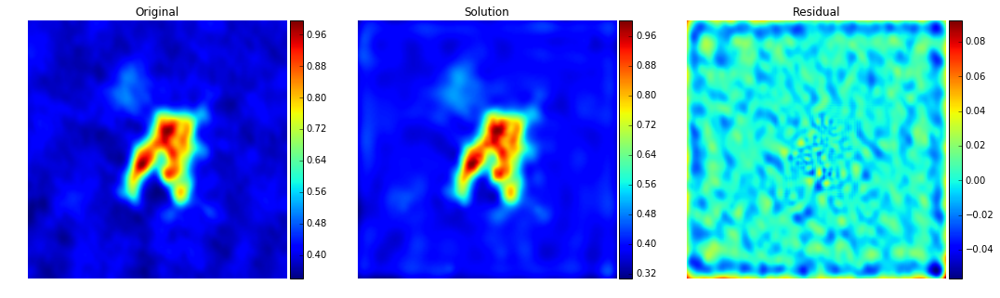

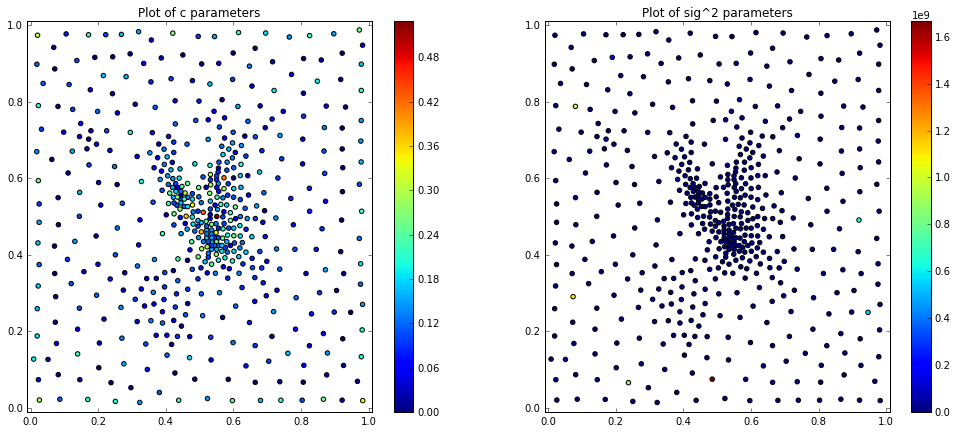

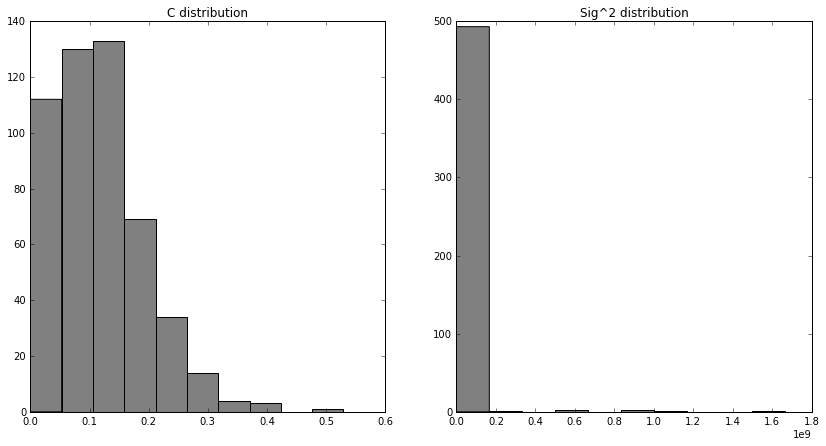

Variation on sig=79105.9770465

nfev: 10026

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 1666635770.85 and 438

min sig and position: 1.55666112654e-06 and 439
-------------------------------------------------------------


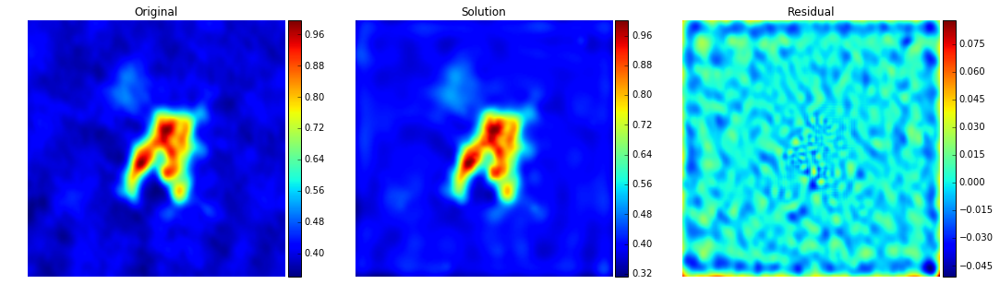

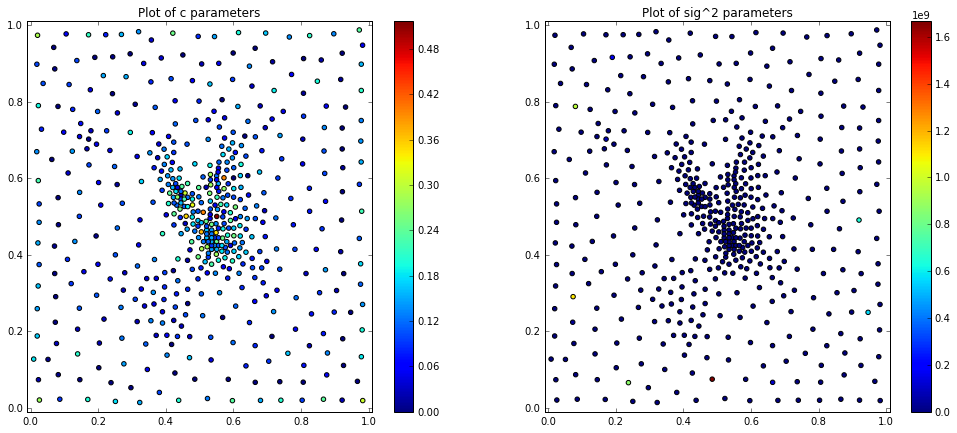

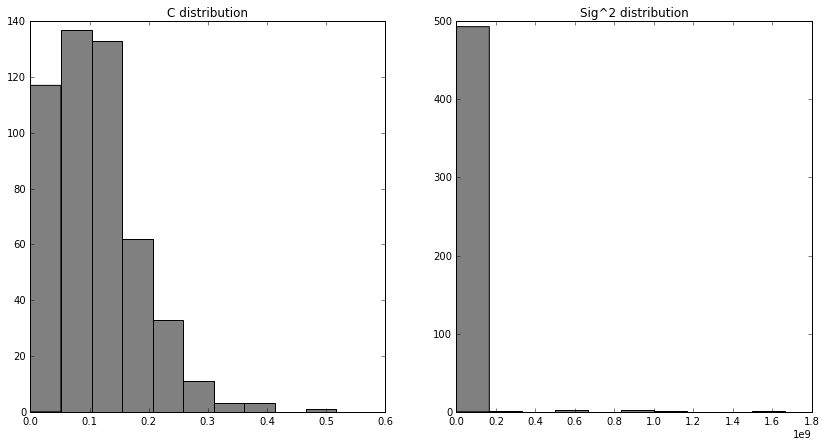

Variation on c=0.43301829814

nfev: 10029

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.516847337774 and 170
------------------------------------------------------------


In [ ]:
el_solver(elf1, method='iterative', n_iter=5, base_level=0., square_c=True)

### C-not squared and compact support

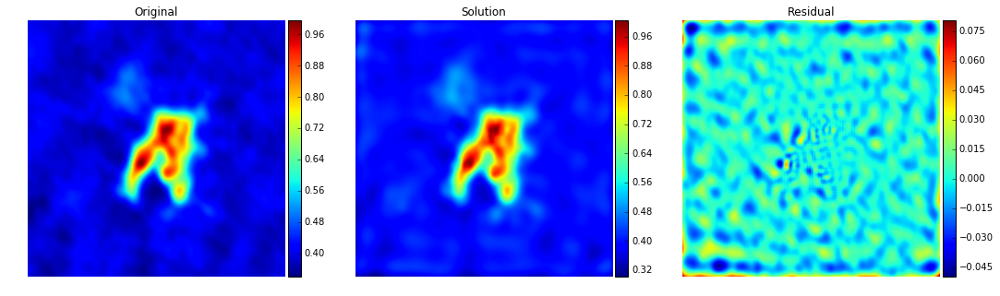

Variation on c=3.15758914577

nfev: 3508

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.499068790352 and 30
------------------------------------------------------------


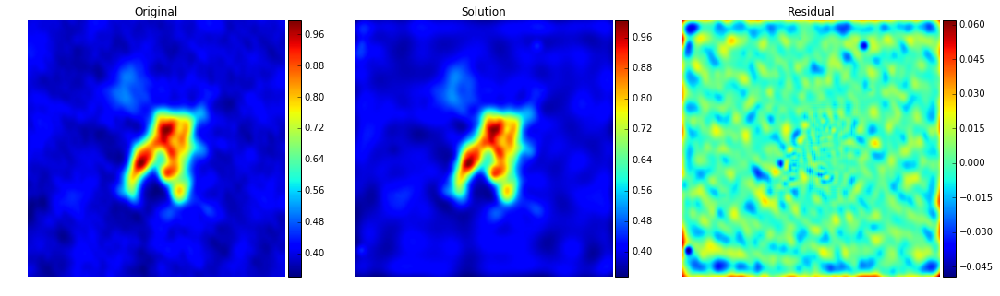

Variation on sig=0.496964121487

nfev: 10028

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.194358426061 and 461

min sig and position: 2.51080402431e-08 and 350
-------------------------------------------------------------


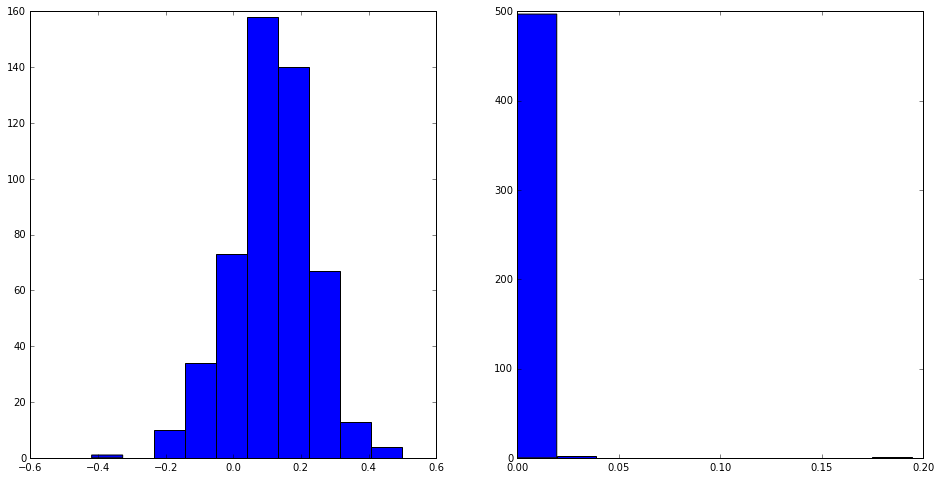

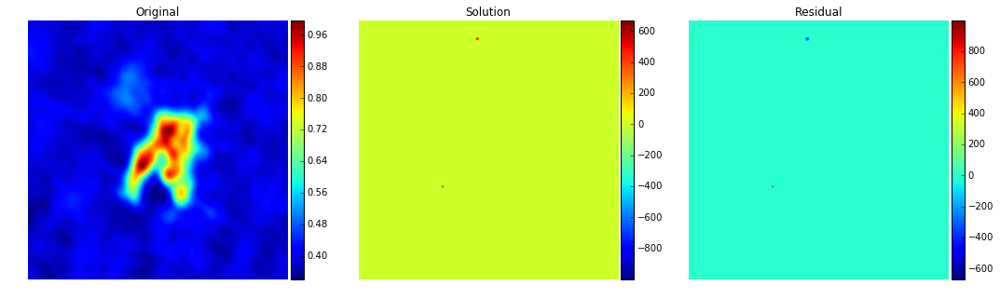

Variation on c=1717.08791414

nfev: 2506

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 797.138729936 and 310
------------------------------------------------------------


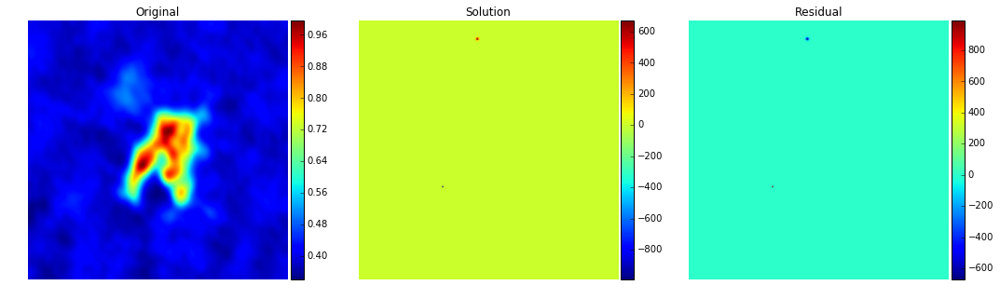

Variation on sig=0.335426463985

nfev: 10025

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.194554534642 and 461

min sig and position: 2.51080402431e-08 and 350
-------------------------------------------------------------


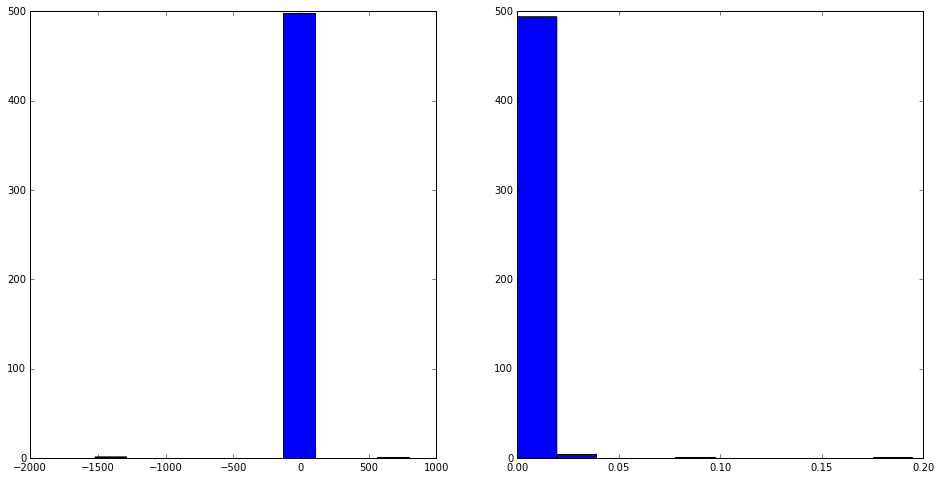

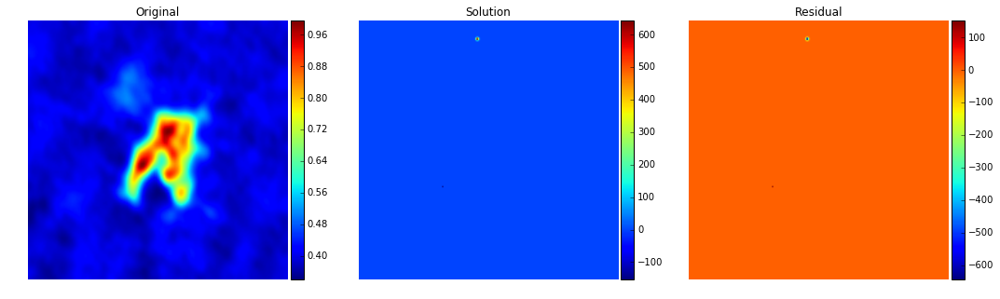

Variation on c=1286.10157543

nfev: 2506

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 765.08274497 and 310
------------------------------------------------------------


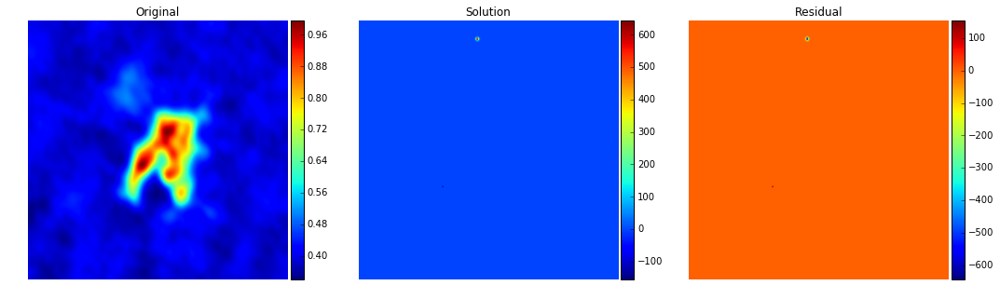

Variation on sig=0.240382910762

nfev: 10024

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.194726311417 and 461

min sig and position: 2.51080402431e-08 and 350
-------------------------------------------------------------


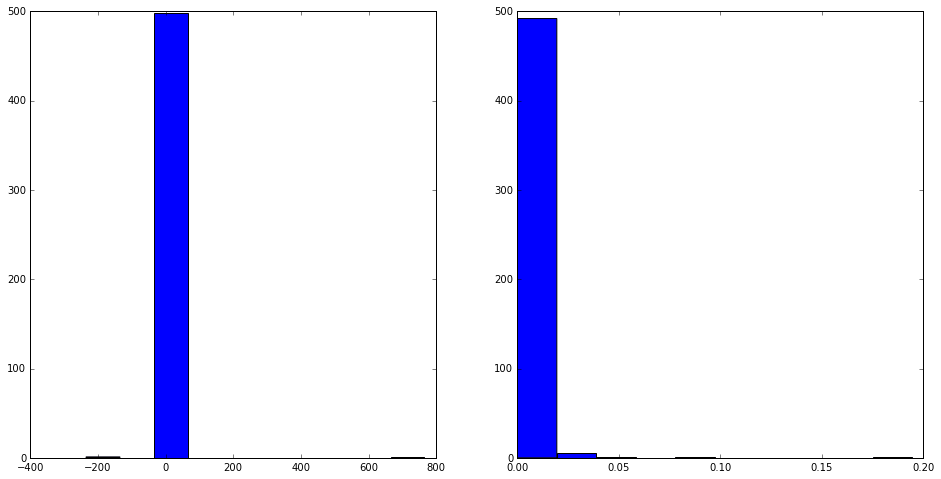

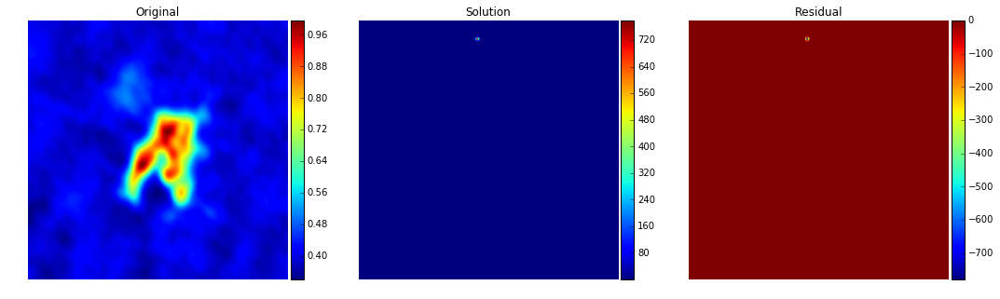

Variation on c=333.843761902

nfev: 2506

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 925.875760545 and 310
------------------------------------------------------------


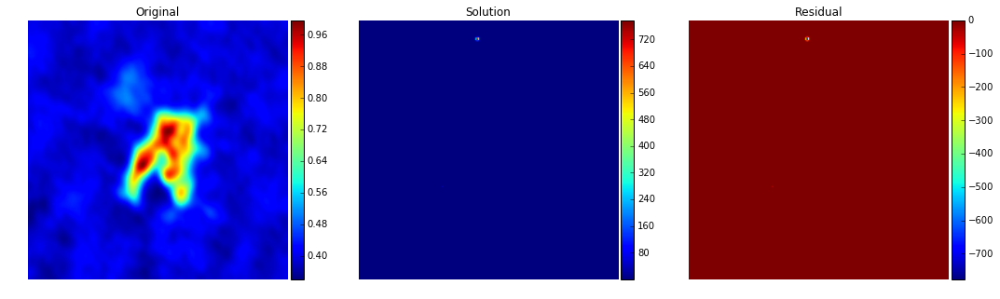

Variation on sig=0.106653457388

nfev: 10027

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.195284057035 and 461

min sig and position: 2.51080402431e-08 and 350
-------------------------------------------------------------


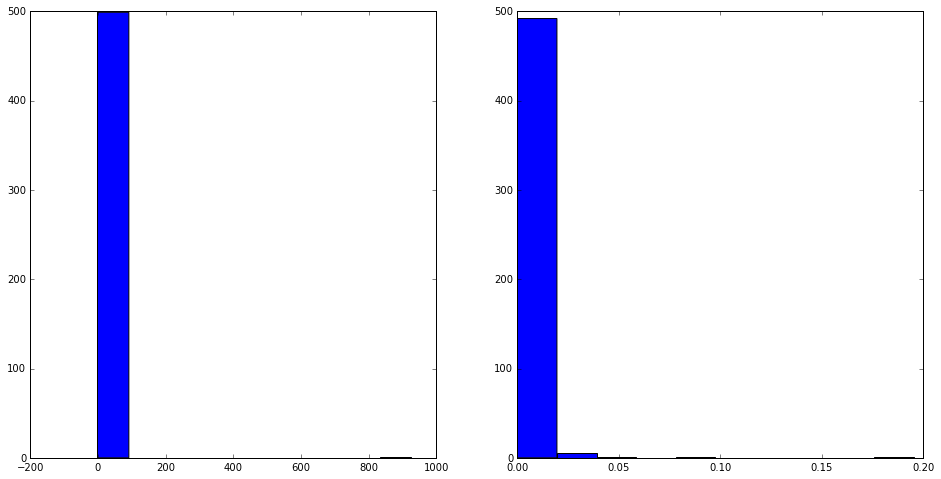

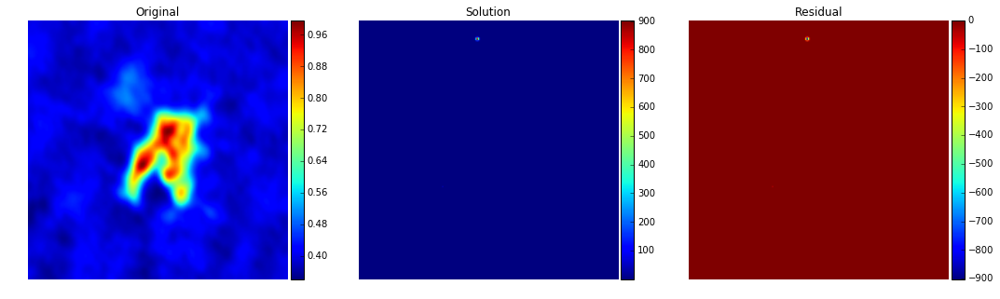

Variation on c=149.268569753

nfev: 3011

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 1075.1352836 and 310
------------------------------------------------------------


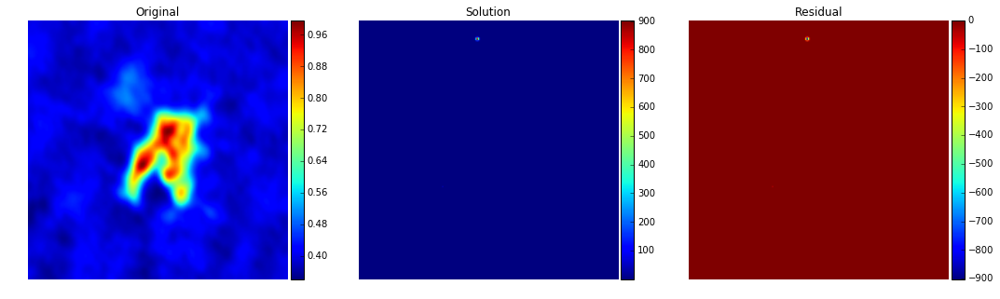

Variation on sig=0.0

nfev: 509

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 0.195284057035 and 461

min sig and position: 2.51080402431e-08 and 350
-------------------------------------------------------------


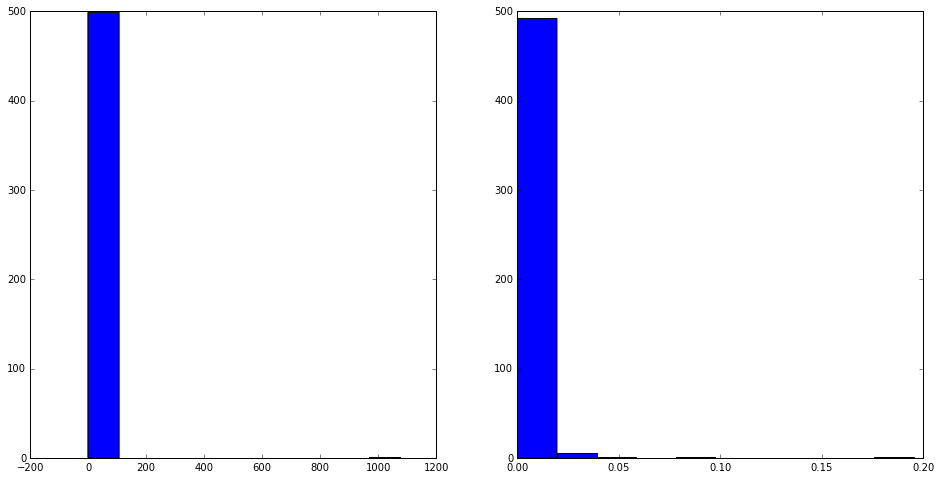


 
 SOME FINAL RESULTS:


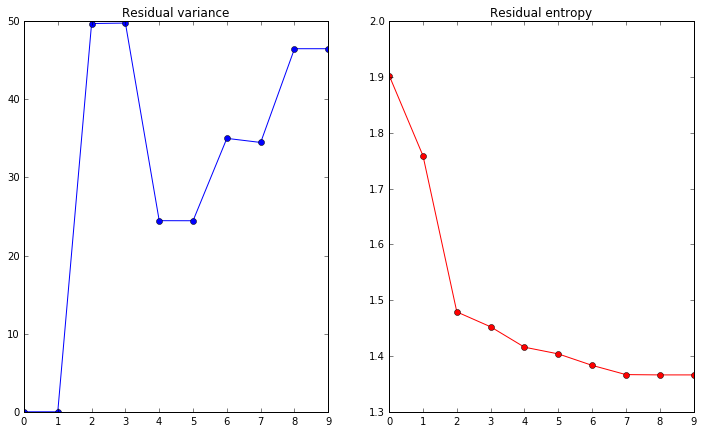

In [131]:
el_solver(elf2, method='iterative', n_iter=5, base_level=0., square_c=False)

### C-squared and no compact support

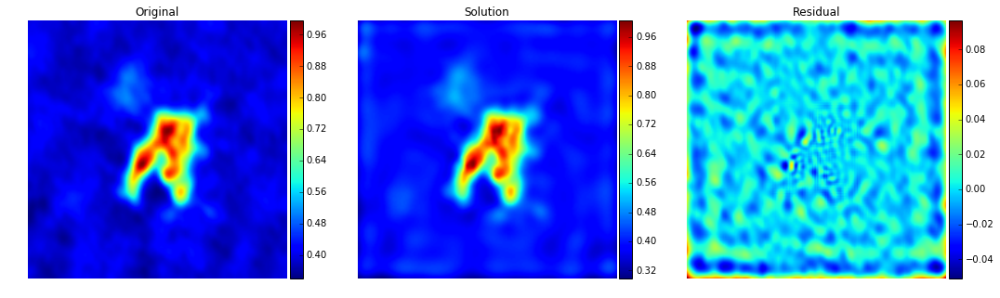

Variation on c=4.43107179473

nfev: 10028

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.44385696083 and 30
------------------------------------------------------------


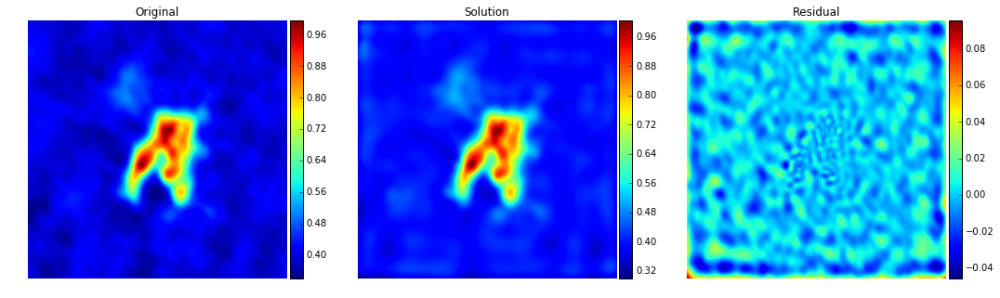

Variation on sig=209809.89334

nfev: 10025

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 23142379230.0 and 299

min sig and position: 1.14265759625e-06 and 75
-------------------------------------------------------------


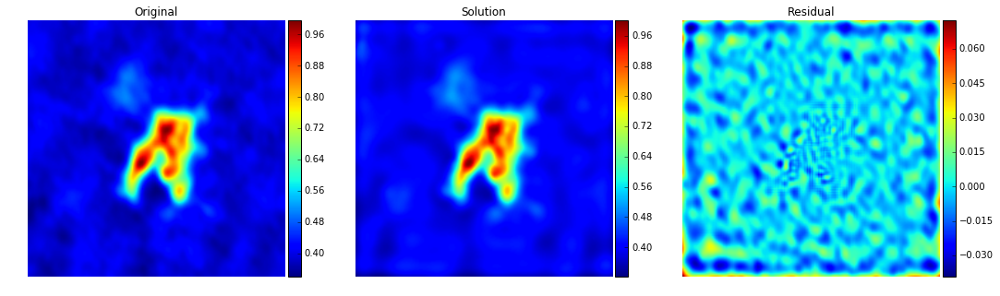

Variation on c=0.516890377056

nfev: 10029

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.427885756186 and 30
------------------------------------------------------------


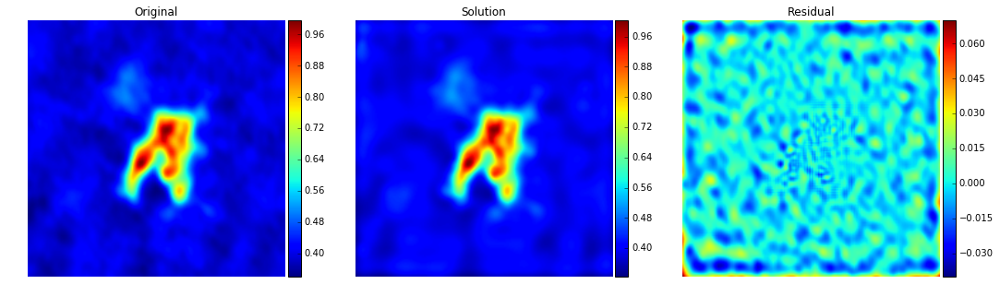

Variation on sig=22157341491.7

nfev: 10025

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 2.46075070101e+20 and 403

min sig and position: 1.14265759625e-06 and 75
-------------------------------------------------------------


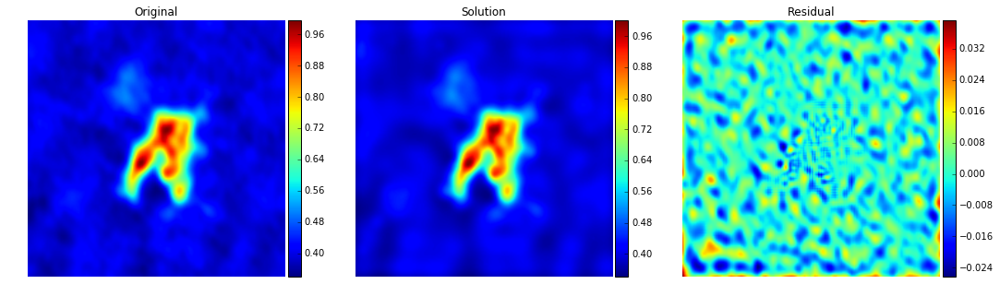

Variation on c=1.36931274513

nfev: 10028

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.374642139751 and 30
------------------------------------------------------------


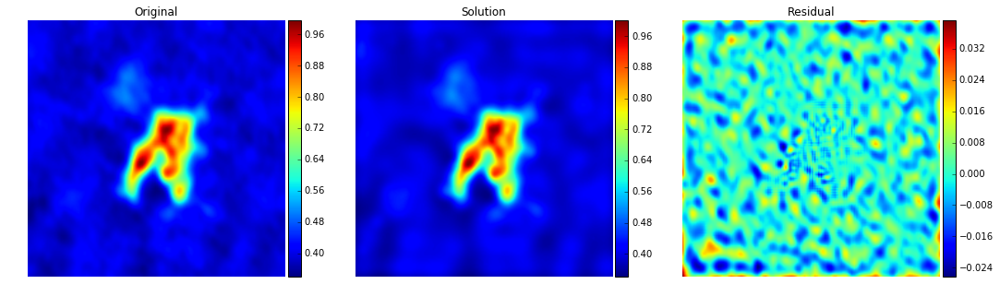

Variation on sig=0.0

nfev: 502

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 2.46075070101e+20 and 403

min sig and position: 1.14265759625e-06 and 75
-------------------------------------------------------------


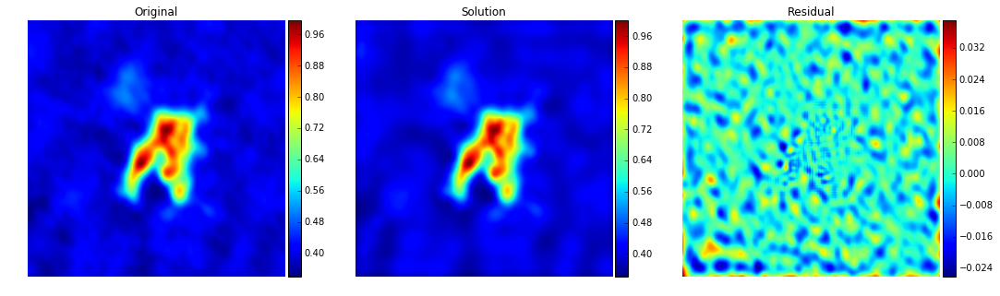

Variation on c=0.0325247022031

nfev: 10032

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.374246562884 and 30
------------------------------------------------------------


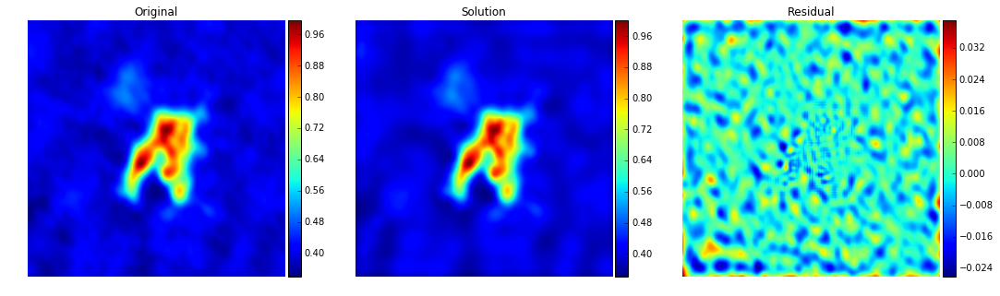

Variation on sig=0.0

nfev: 502

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 2.46075070101e+20 and 403

min sig and position: 1.14265759625e-06 and 75
-------------------------------------------------------------


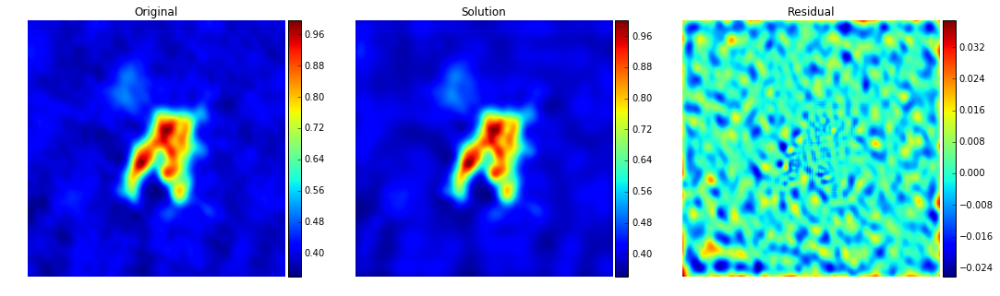

Variation on c=0.0371678758061

nfev: 10030

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.373814668279 and 30
------------------------------------------------------------


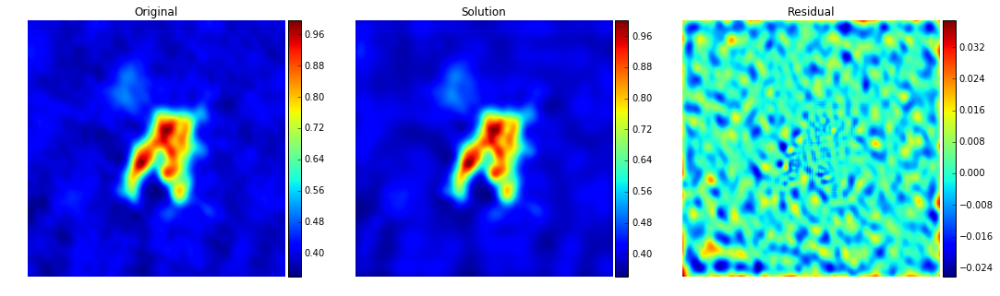

Variation on sig=0.0

nfev: 502

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 2.46075070101e+20 and 403

min sig and position: 1.14265759625e-06 and 75
-------------------------------------------------------------

 
 SOME FINAL RESULTS:


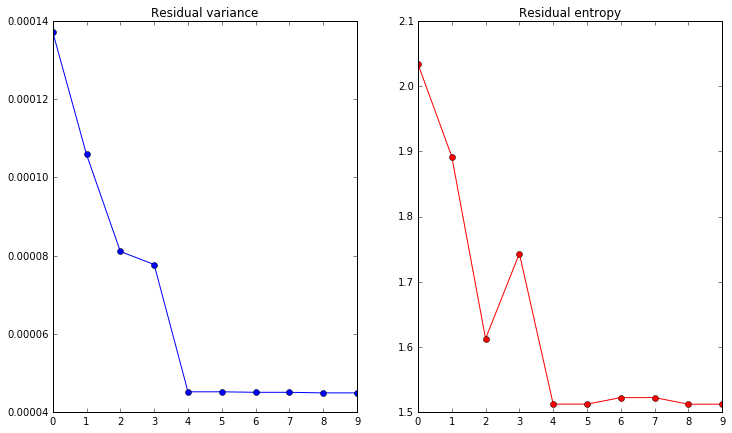

In [111]:
el_solver(elf3, method='iterative', n_iter=5, base_level=0., square_c=True)

### C-not squared and no compact support

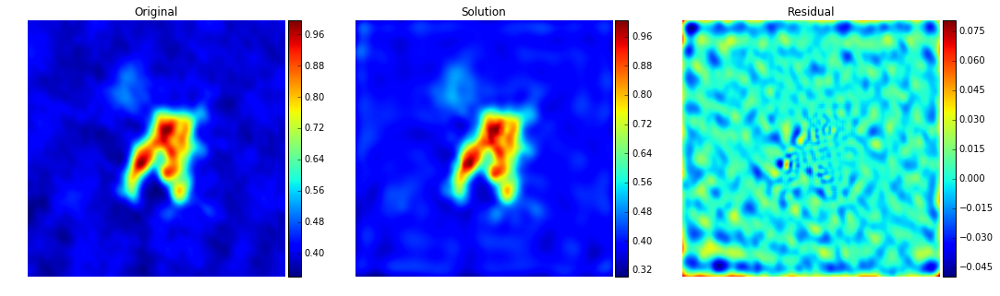

Variation on c=3.15758640828

nfev: 3508

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.499068003689 and 30
------------------------------------------------------------


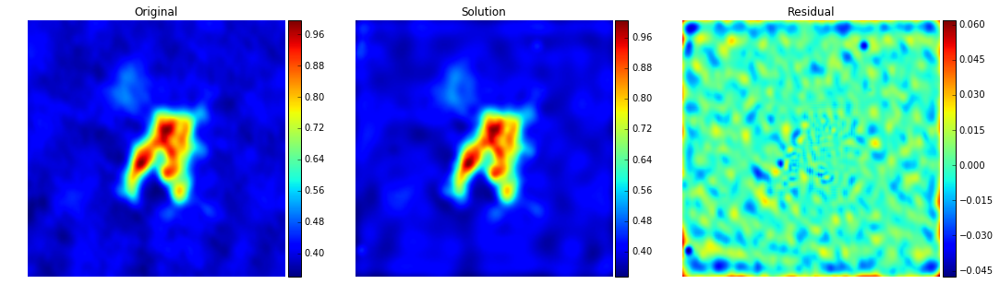

Variation on sig=0.564465862165

nfev: 10026

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.172087809518 and 461

min sig and position: 1.43783389166e-08 and 310
-------------------------------------------------------------


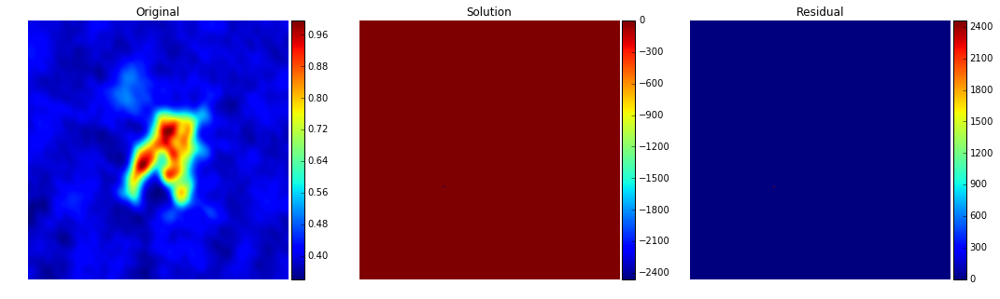

Variation on c=3869.18360562

nfev: 2506

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 1.07530717309 and 435
------------------------------------------------------------


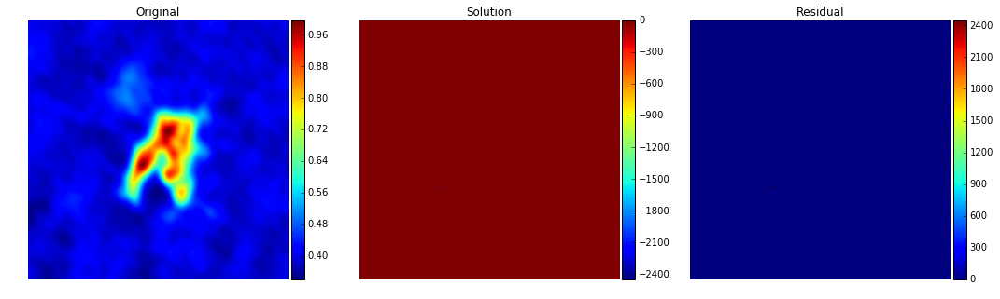

Variation on sig=2.25831703109

nfev: 10026

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 4.83370247976 and 414

min sig and position: 1.43783389166e-08 and 310
-------------------------------------------------------------


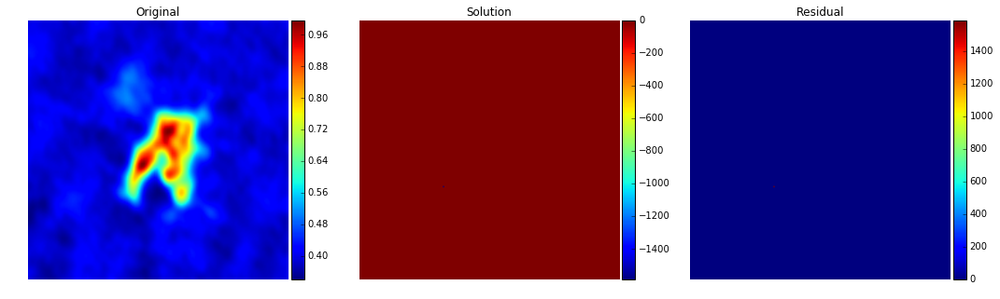

Variation on c=1361.30048045

nfev: 3007

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.46042605677 and 435
------------------------------------------------------------


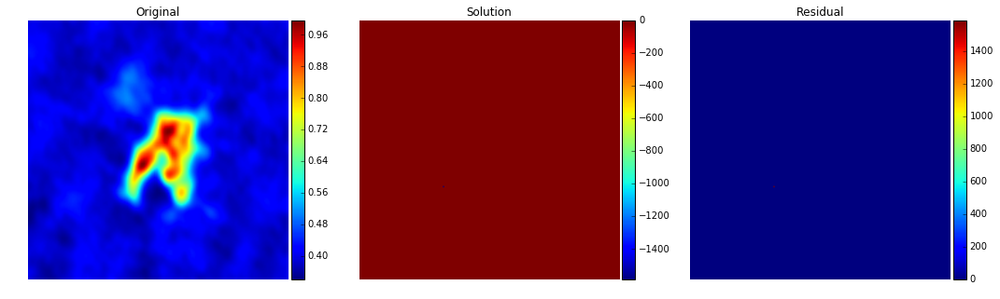

Variation on sig=0.0

nfev: 508

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 4.83370247976 and 414

min sig and position: 1.43783389166e-08 and 310
-------------------------------------------------------------


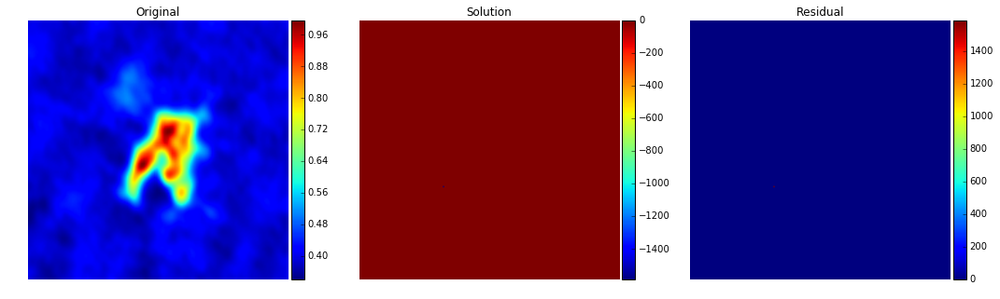

Variation on c=0.0

nfev: 502

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.46042605677 and 435
------------------------------------------------------------


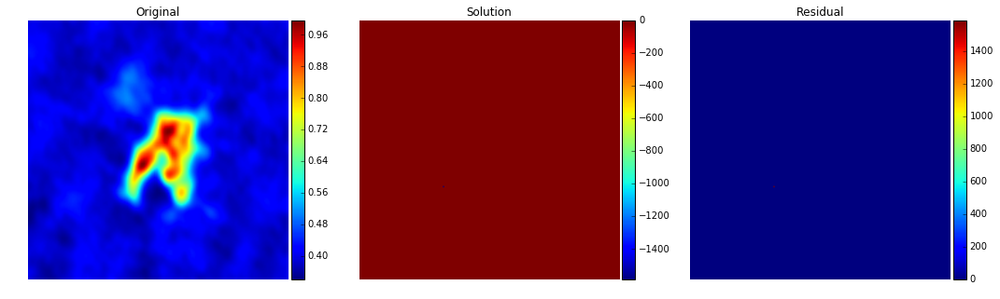

Variation on sig=0.0

nfev: 508

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 4.83370247976 and 414

min sig and position: 1.43783389166e-08 and 310
-------------------------------------------------------------


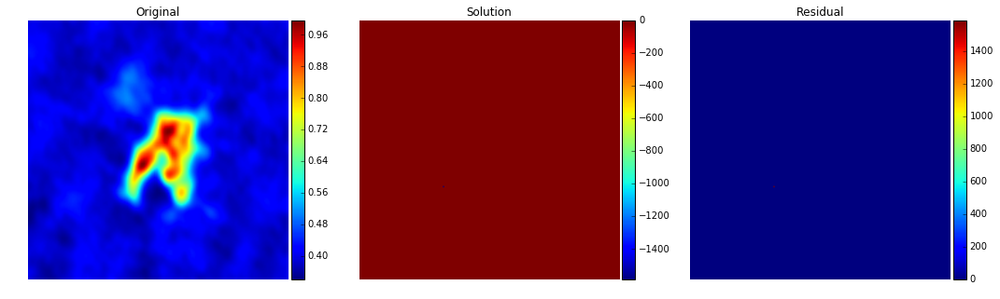

Variation on c=0.0

nfev: 502

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.46042605677 and 435
------------------------------------------------------------


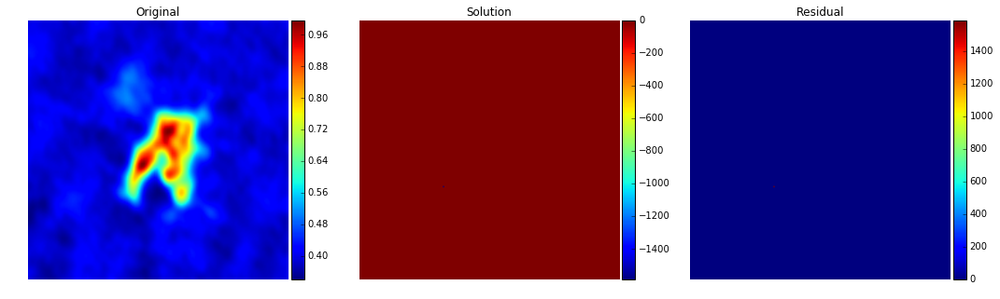

Variation on sig=0.0

nfev: 508

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 4.83370247976 and 414

min sig and position: 1.43783389166e-08 and 310
-------------------------------------------------------------

 
 SOME FINAL RESULTS:


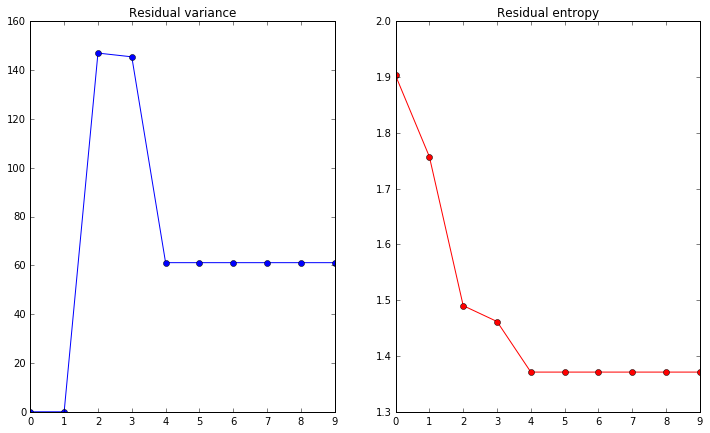

In [112]:
el_solver(elf4, method='iterative', n_iter=5, base_level=0., square_c=False)

## Experiments 2: With `base_level=RMS`

In [113]:
"""
Selecting just the interior points
"""
_xc = center_points[:Nc/2,0]
_yc = center_points[:Nc/2,1]
_xe = collocation_points[:Ne/2,0]
_ye = collocation_points[:Ne/2,1]

In [114]:
rms = estimate_rms(data)
_c0 = c0[:Nc/2]
_sig0 = sig0[:Nc/2]

"""
ELFunc instantiations
"""
elf5 = ELFunc(f, _xe, _ye, _xc, _yc, xb, yb, np.sqrt(_c0), _sig0, a=1., lamb1=1., d1psi1=d1psi, d1psi2=d1psi,
              d2psi2=d2psi, base_level=rms, square_c=True, compact_supp=True)

elf6 = ELFunc(f, _xe, _ye, _xc, _yc, xb, yb, _c0, _sig0, a=1., lamb1=1., d1psi1=d1psi, d1psi2=d1psi,
              d2psi2=d2psi, base_level=rms, square_c=False, compact_supp=True)

elf7 = ELFunc(f, _xe, _ye, _xc, _yc, xb, yb, np.sqrt(_c0), _sig0, a=1., lamb1=1., d1psi1=d1psi, d1psi2=d1psi,
              d2psi2=d2psi, base_level=rms, square_c=True, compact_supp=False)

elf8 = ELFunc(f, _xe, _ye, _xc, _yc, xb, yb, _c0, _sig0, a=1., lamb1=1., d1psi1=d1psi, d1psi2=d1psi,
              d2psi2=d2psi, base_level=rms, square_c=False, compact_supp=False)

### C-squared and compact support

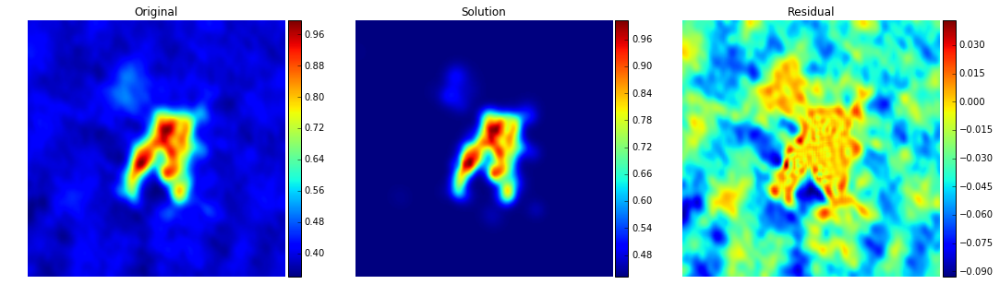

Variation on c=2.01005164642

nfev: 10050

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266967409301 and 30
------------------------------------------------------------


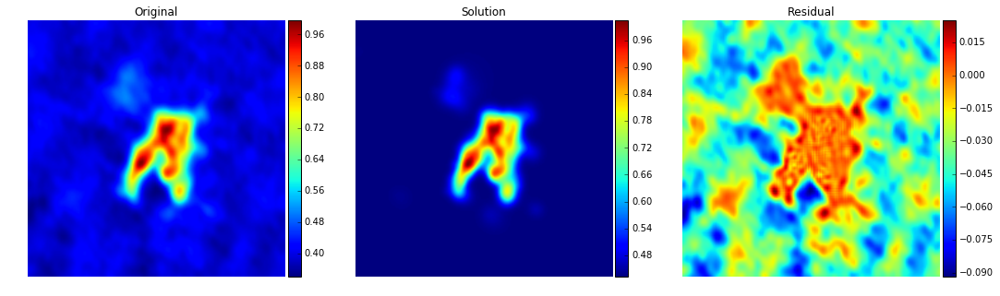

Variation on sig=37731.3739985

nfev: 10054

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 669740103.685 and 91

min sig and position: 1.45908126402e-07 and 217
-------------------------------------------------------------


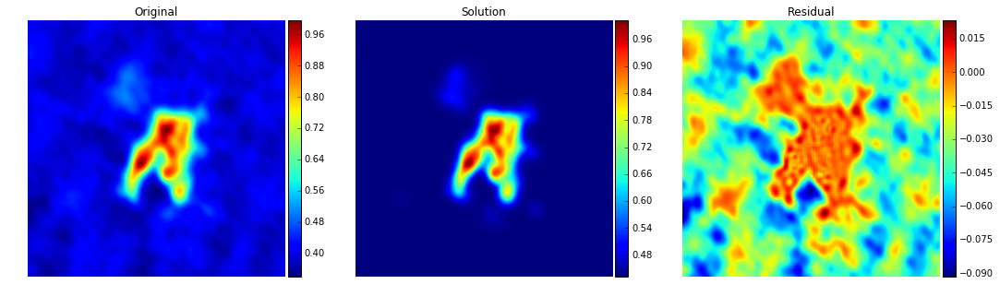

Variation on c=0.11569210529

nfev: 10051

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266993112 and 30
------------------------------------------------------------


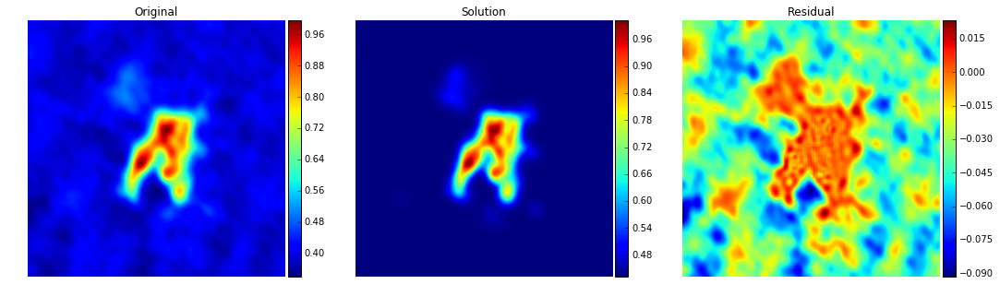

Variation on sig=0.0

nfev: 254

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 669740103.685 and 91

min sig and position: 1.45908126402e-07 and 217
-------------------------------------------------------------


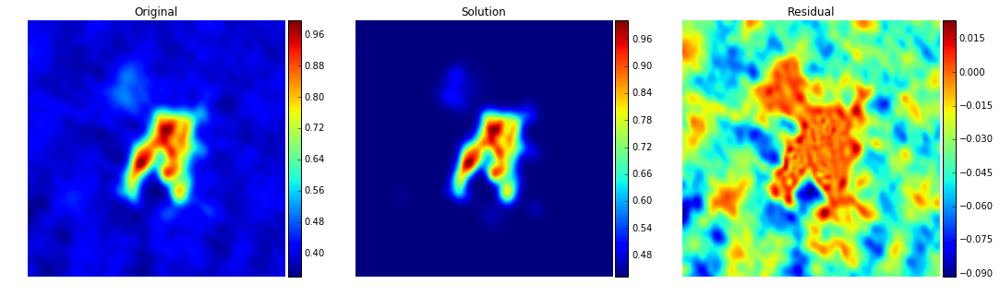

Variation on c=0.00245166442573

nfev: 10049

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266992248569 and 30
------------------------------------------------------------


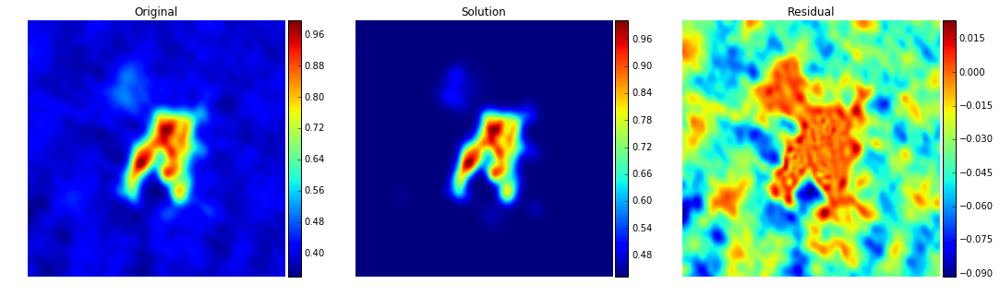

Variation on sig=0.0

nfev: 254

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 669740103.685 and 91

min sig and position: 1.45908126402e-07 and 217
-------------------------------------------------------------


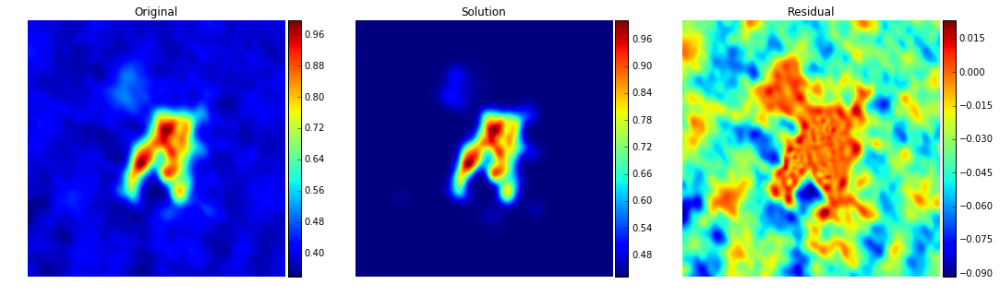

Variation on c=0.0017705244173

nfev: 10048

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266991608543 and 30
------------------------------------------------------------


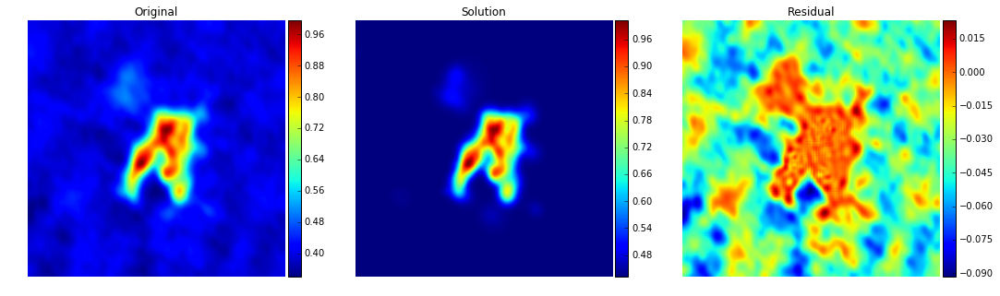

Variation on sig=357408.063738

nfev: 3773

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 1.27740527526e+11 and 161

min sig and position: 1.42761879989e-07 and 217
-------------------------------------------------------------


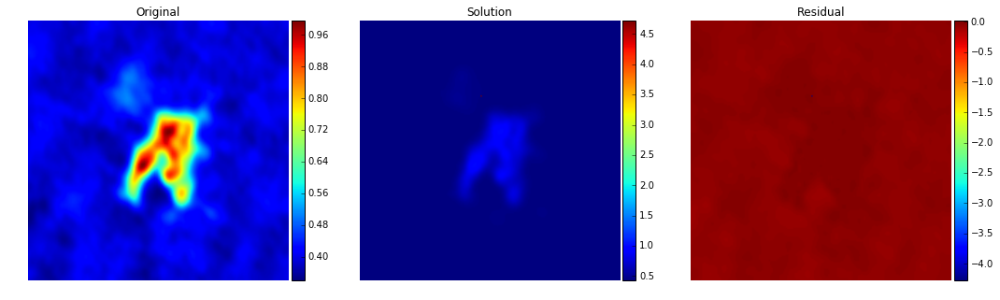

Variation on c=2.05339838188

nfev: 10050

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 4.38103526827 and 217
------------------------------------------------------------


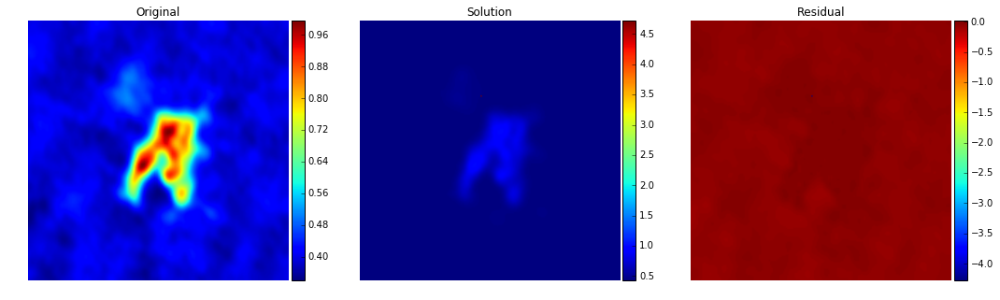

Variation on sig=0.0

nfev: 253

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 1.27740527526e+11 and 161

min sig and position: 1.42761879989e-07 and 217
-------------------------------------------------------------

 
 SOME FINAL RESULTS:


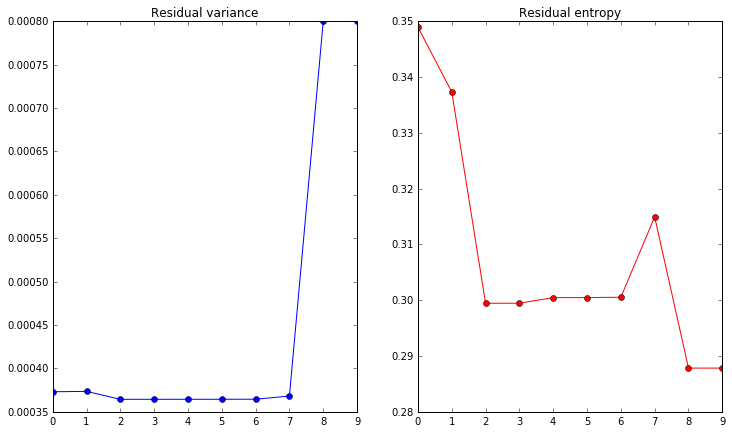

In [115]:
el_solver(elf5, method='iterative', n_iter=5, base_level=rms, square_c=True)

### C-not squared and compact support

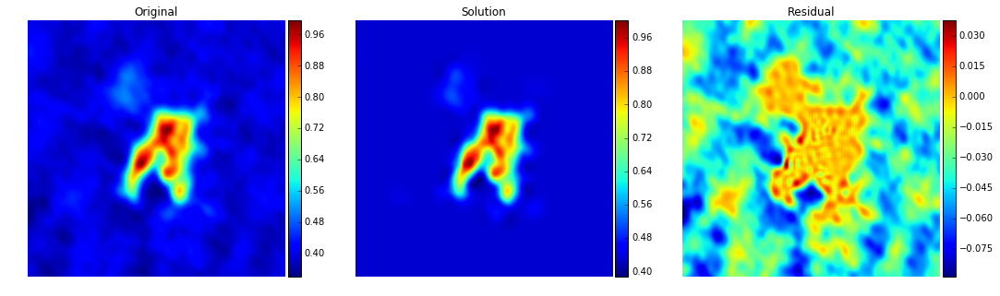

Variation on c=1.05539592584

nfev: 1758

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.2943210807 and 30
------------------------------------------------------------


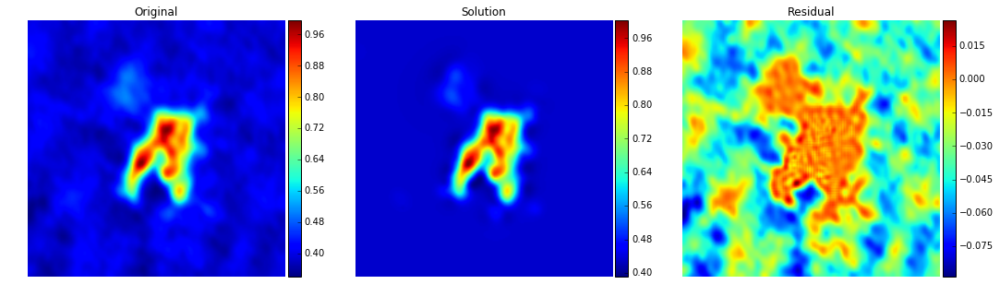

Variation on sig=0.149814632446

nfev: 10048

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.00793984786348 and 122

min sig and position: 1.92936615064e-07 and 61
-------------------------------------------------------------


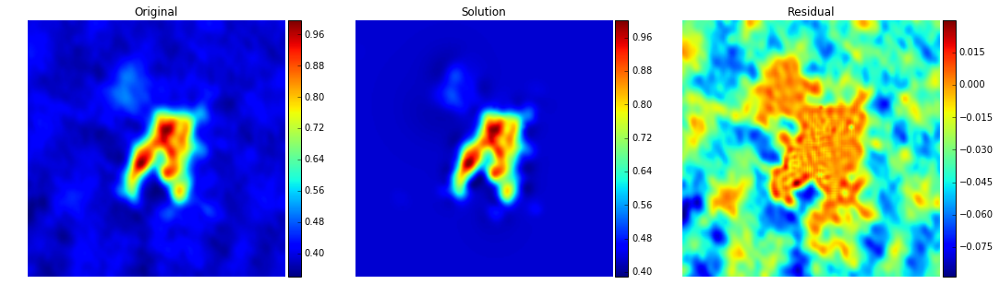

Variation on c=0.18132946978

nfev: 1256

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.297488121938 and 30
------------------------------------------------------------


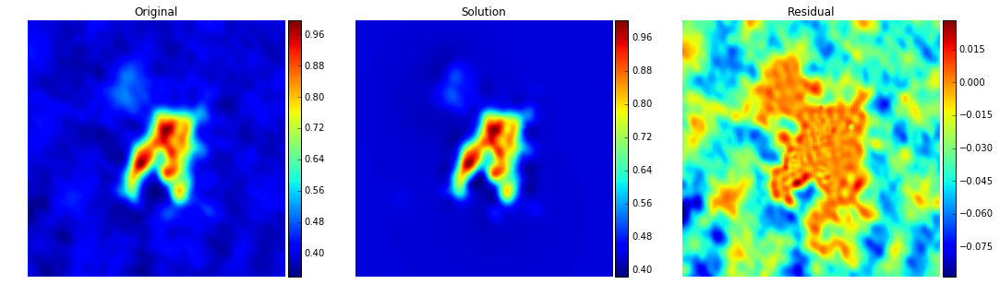

Variation on sig=0.179437999403

nfev: 10051

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.0290861270419 and 54

min sig and position: 1.89378947719e-07 and 180
-------------------------------------------------------------


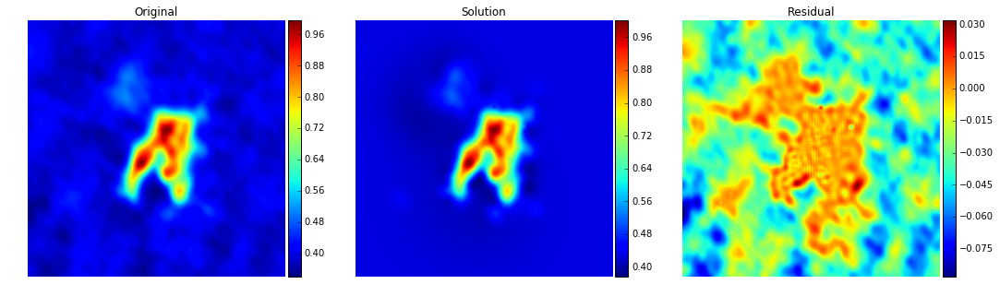

Variation on c=0.204252314271

nfev: 1005

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.304773871872 and 125
------------------------------------------------------------


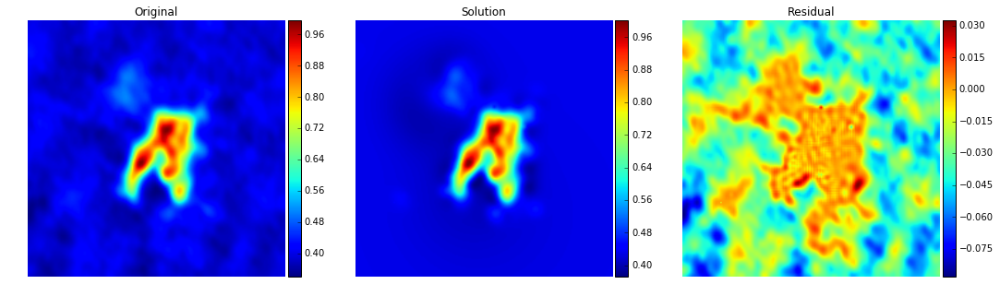

Variation on sig=0.108722858789

nfev: 10053

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.0430596500243 and 34

min sig and position: 1.47277185071e-07 and 180
-------------------------------------------------------------


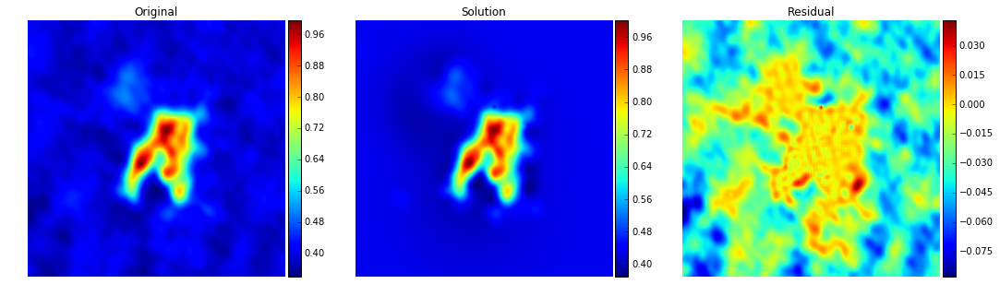

Variation on c=0.14433037031

nfev: 1005

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.325038220825 and 125
------------------------------------------------------------


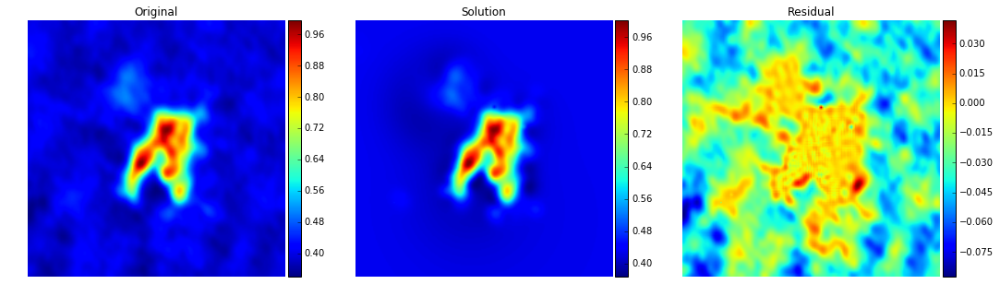

Variation on sig=0.0892207794374

nfev: 10045

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.0728456448844 and 34

min sig and position: 3.68513897037e-08 and 180
-------------------------------------------------------------


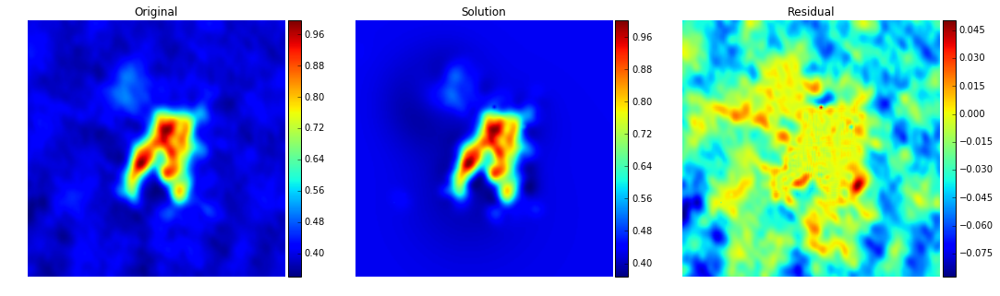

Variation on c=0.113845425227

nfev: 1005

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.342666716161 and 125
------------------------------------------------------------


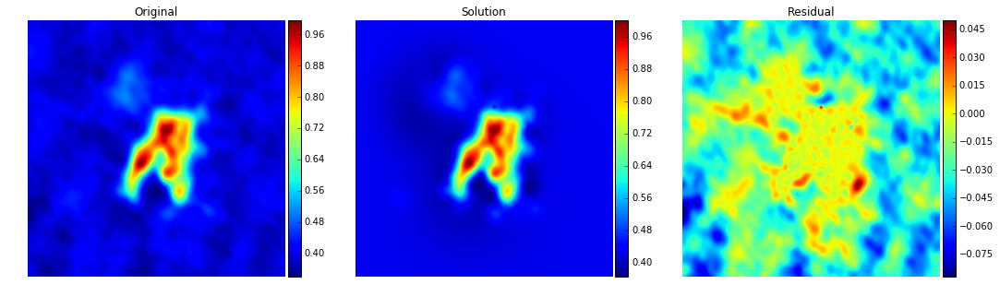

Variation on sig=0.107379499238

nfev: 10048

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.115546848704 and 34

min sig and position: 9.93813316617e-08 and 180
-------------------------------------------------------------

 
 SOME FINAL RESULTS:


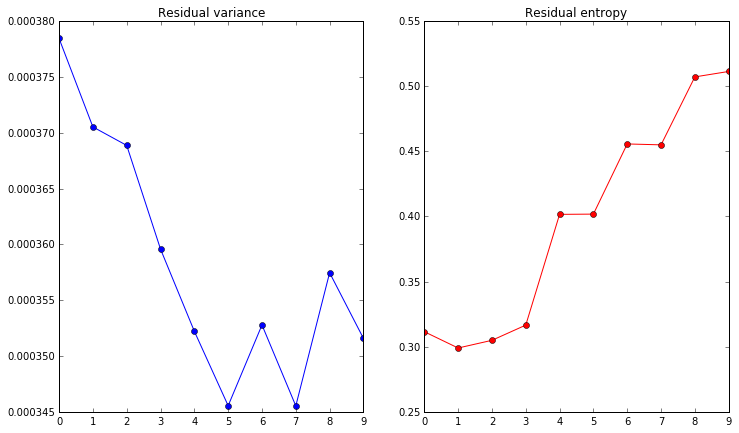

In [116]:
el_solver(elf6, method='iterative', n_iter=5, base_level=rms, square_c=False)

### C-squared and no compact support

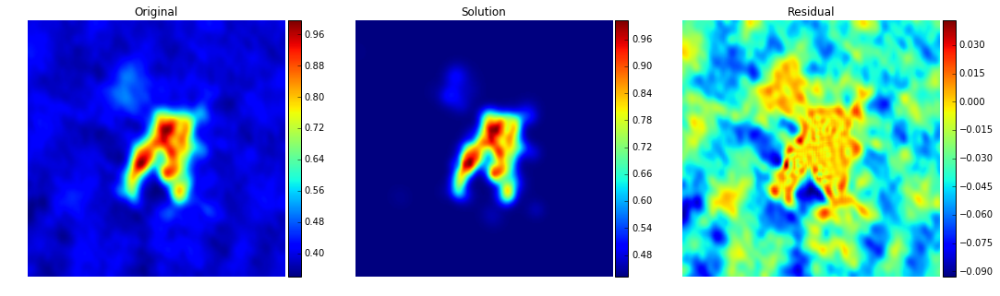

Variation on c=2.0081055389

nfev: 10050

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266219808352 and 30
------------------------------------------------------------


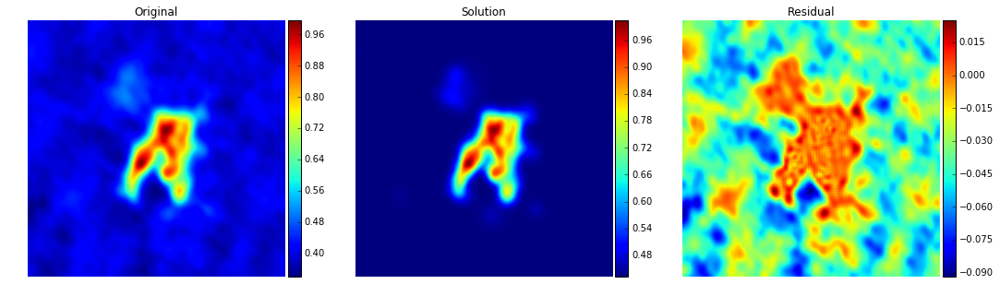

Variation on sig=41182.7488149

nfev: 10049

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 425549207.598 and 18

min sig and position: 2.72220001512e-07 and 223
-------------------------------------------------------------


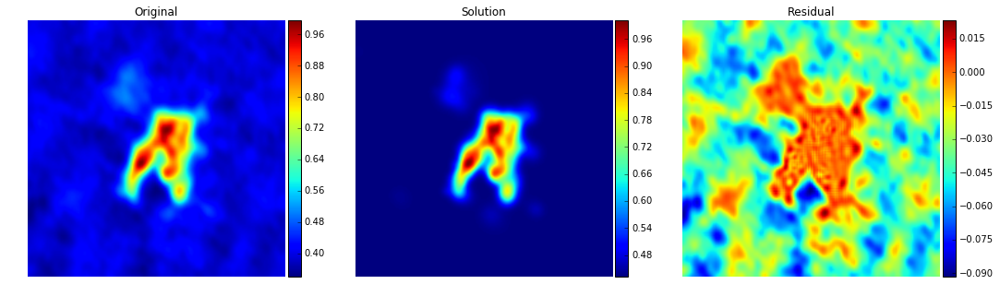

Variation on c=0.110804952467

nfev: 10050

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266335229495 and 30
------------------------------------------------------------


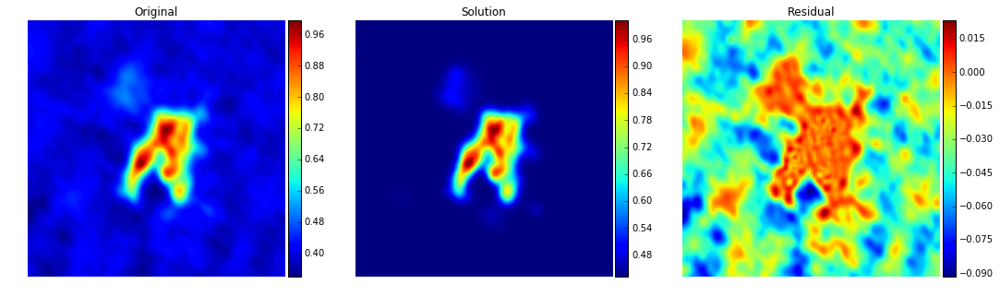

Variation on sig=153417936.155

nfev: 6298

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 2.35365994731e+16 and 179

min sig and position: 2.72220001512e-07 and 223
-------------------------------------------------------------


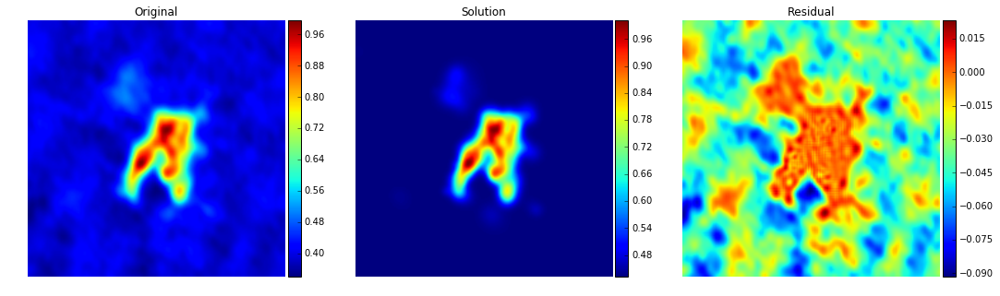

Variation on c=0.0826140880912

nfev: 10050

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266349625839 and 30
------------------------------------------------------------


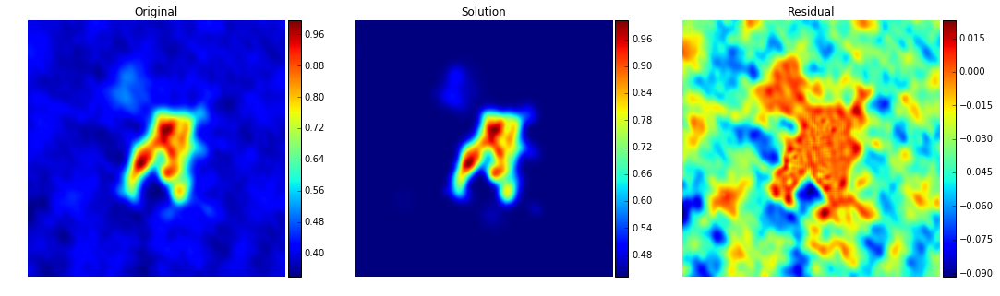

Variation on sig=147892021.15

nfev: 252

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 2.35365994731e+16 and 179

min sig and position: 2.72220001512e-07 and 223
-------------------------------------------------------------


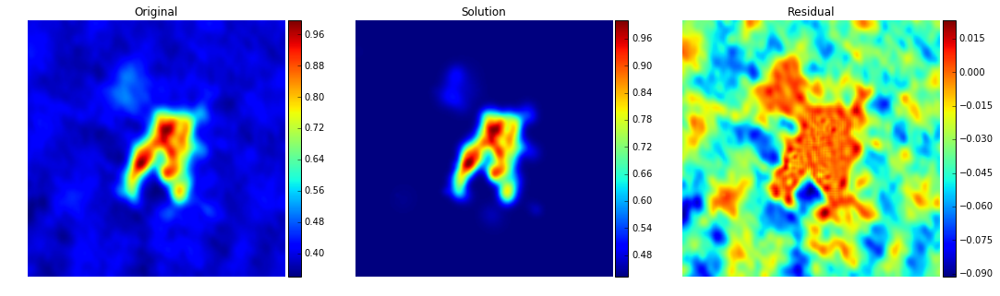

Variation on c=0.0336679922052

nfev: 10052

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266310976427 and 30
------------------------------------------------------------


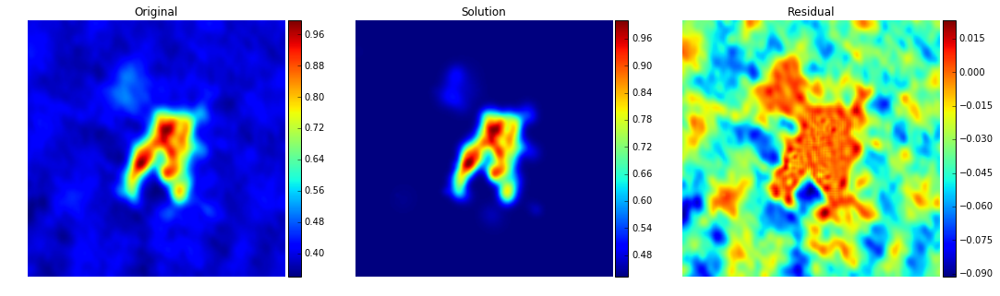

Variation on sig=0.0

nfev: 252

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 2.35365994731e+16 and 179

min sig and position: 2.72220001512e-07 and 223
-------------------------------------------------------------


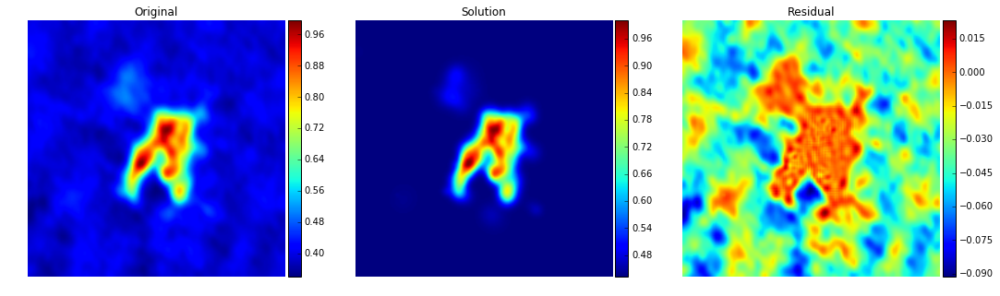

Variation on c=0.000868894093348

nfev: 10047

message: Number of calls to function has reached maxfev = 10000.

success: False

max c and position: 0.266310773045 and 30
------------------------------------------------------------


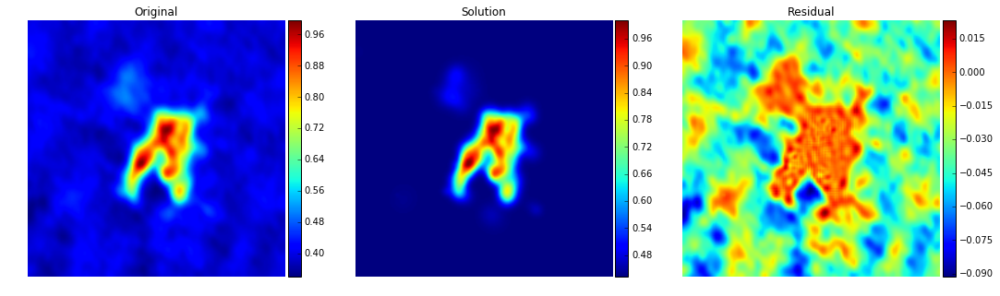

Variation on sig=0.0

nfev: 252

message: The relative error between two consecutive iterates is at most 0.000000

success: True

max sig and position: 2.35365994731e+16 and 179

min sig and position: 2.72220001512e-07 and 223
-------------------------------------------------------------

 
 SOME FINAL RESULTS:


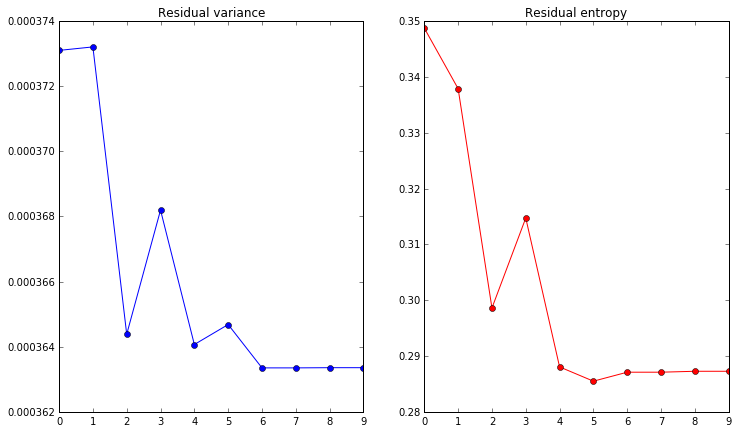

In [117]:
el_solver(elf7, method='iterative', n_iter=5, base_level=rms, square_c=True)

### C-not squared and no compact support

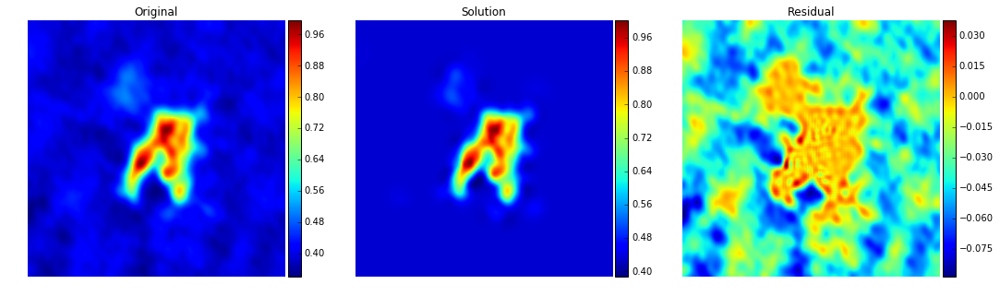

Variation on c=1.05539471754

nfev: 1758

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.294321829846 and 30
------------------------------------------------------------


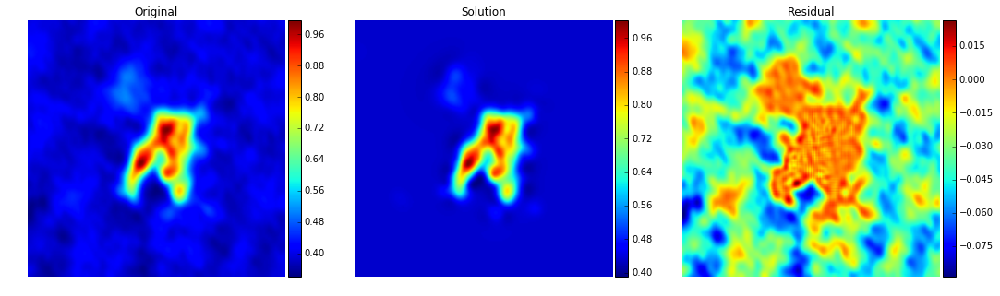

Variation on sig=0.150555652911

nfev: 10048

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.00663115914551 and 122

min sig and position: 6.01736161781e-08 and 61
-------------------------------------------------------------


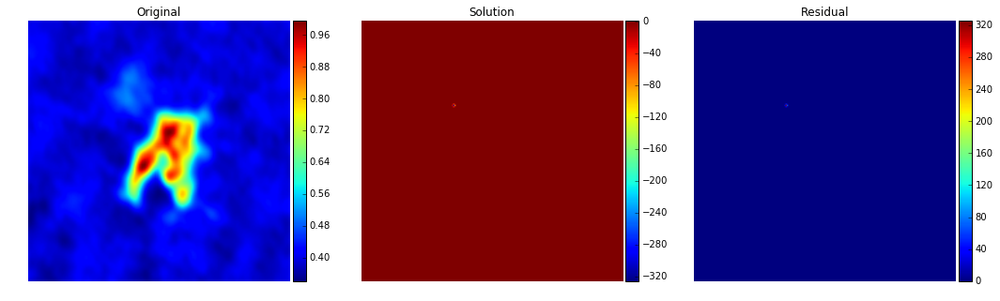

Variation on c=336.697103477

nfev: 1256

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.297980300782 and 30
------------------------------------------------------------


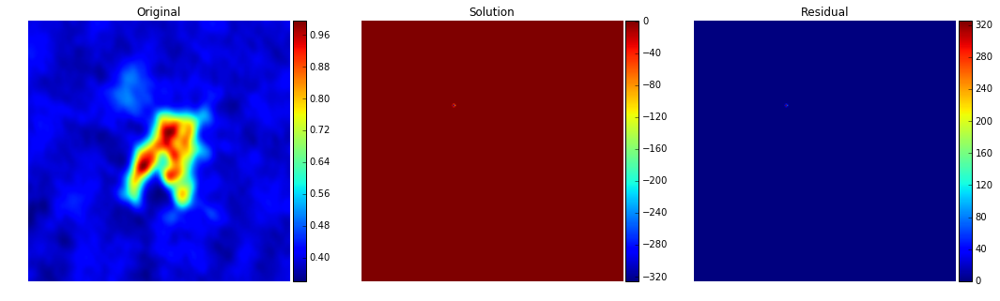

Variation on sig=0.239952843119

nfev: 10050

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.0528048811013 and 54

min sig and position: 6.01736161781e-08 and 61
-------------------------------------------------------------


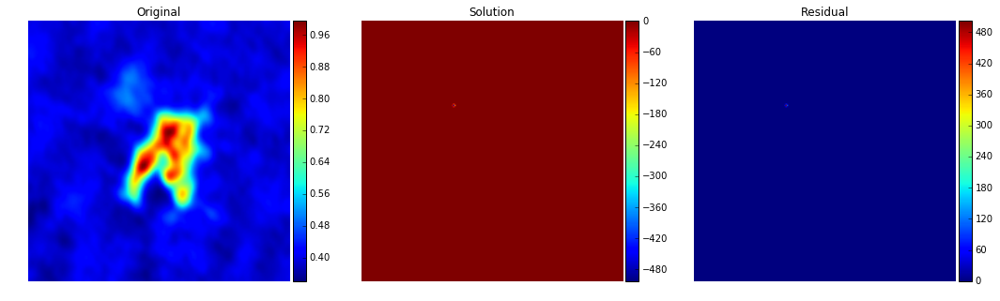

Variation on c=182.809557348

nfev: 1005

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.305991362157 and 122
------------------------------------------------------------


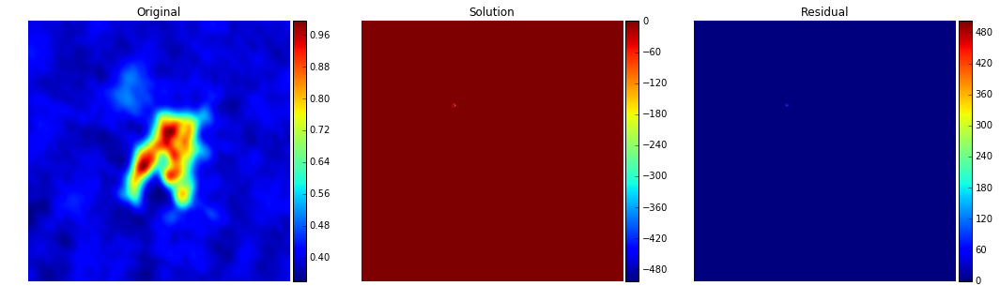

Variation on sig=0.151077578784

nfev: 10050

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.0712713509713 and 68

min sig and position: 6.01736161781e-08 and 61
-------------------------------------------------------------


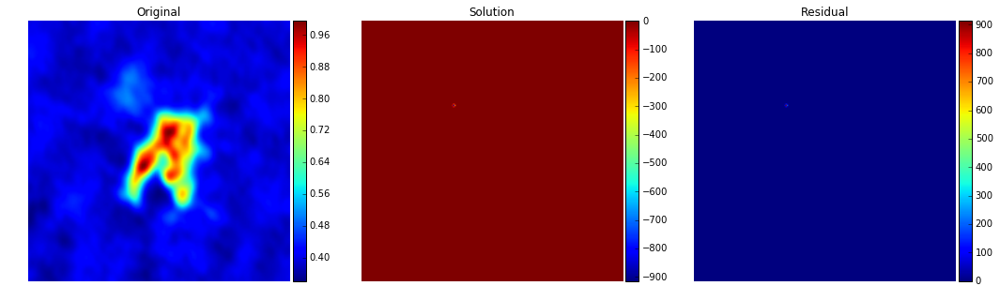

Variation on c=425.921486645

nfev: 1005

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.439406844227 and 122
------------------------------------------------------------


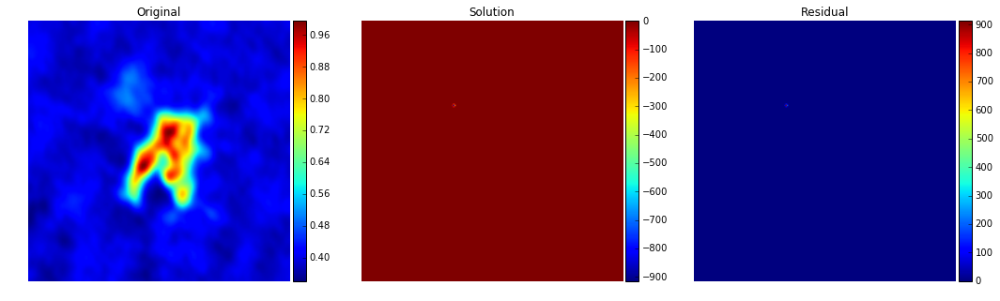

Variation on sig=0.102606854862

nfev: 10049

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.092774761789 and 54

min sig and position: 6.01736161781e-08 and 61
-------------------------------------------------------------


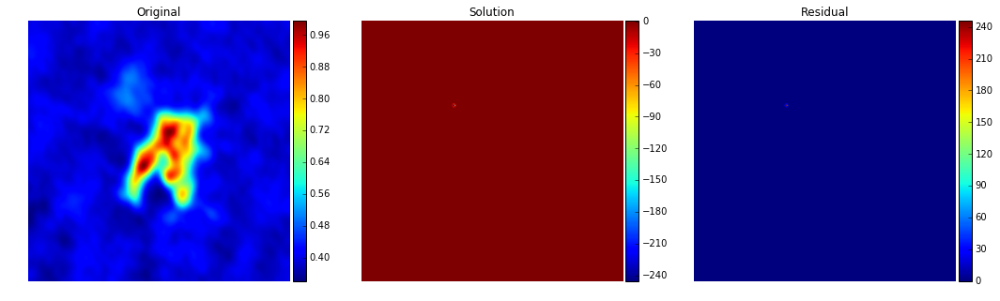

Variation on c=691.138532576

nfev: 1005

message: Both actual and predicted relative reductions in the sum of squares
  are at most 0.000000

success: True

max c and position: 0.342214197252 and 125
------------------------------------------------------------


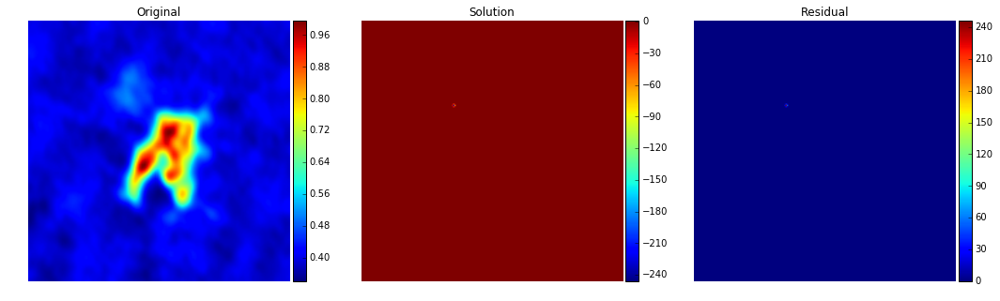

Variation on sig=0.306909091935

nfev: 10045

message: Number of calls to function has reached maxfev = 10000.

success: False

max sig and position: 0.115804723432 and 68

min sig and position: 6.01736161781e-08 and 61
-------------------------------------------------------------

 
 SOME FINAL RESULTS:


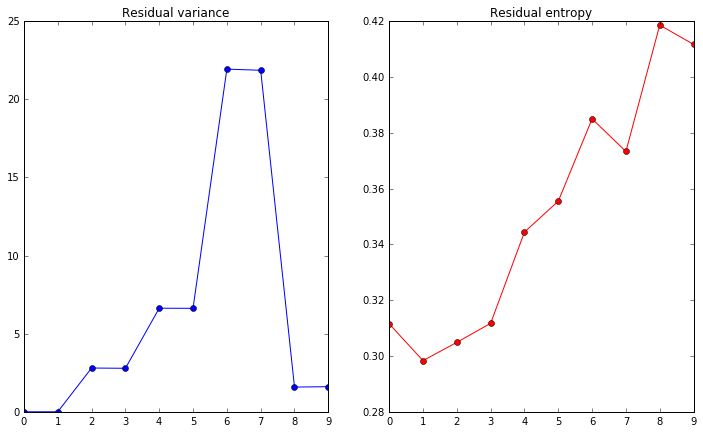

In [118]:
el_solver(elf8, method='iterative', n_iter=5, base_level=rms, square_c=False)